# Image Segmentation of Microvascular Structures in Kidney Tissues


### Introduction to the problem

The goal of this competition is to segment microvascular structures (capillaries, arterioles, and venules) in PAS-stained histology images of human kidney tissues. This will help researchers better understand the spatial organization of blood vessels and contribute to building a Vascular Common Coordinate Framework (VCCF).

The dataset contains annotations for two different structures:
- Blood Vessels: These are tubular structures that transport blood throughout the body. These microvascular structures (arterioles, capillaries, and venules) are responsible for the blood flow in the kidney tissue.
- Glomerulus: This is a specific capillary ball structure found in the kidney. It plays a crucial role in blood filtration within the kidney’s nephron.

It was not clear in the description, but I saw in this comment (https://www.kaggle.com/competitions/hubmap-hacking-the-human-vasculature/discussion/414896) that in submission they will only consider blood vessels and the glomerulus class is only useful to filter out the blood vessels appearing inside them. Therefore, I have to mask out pixels labeled as "glomerulus" before submitting to avoid false positives.

---
### Data description

1. Images: The image data is provided in TIFF format, with each tile being 512x512 pixels in size.
2. Masks: The segmentation masks are stored in a JSON file called polygons.jsonl.

   Each line in the file corresponds to one image and includes:
   - 'id': Identifies the corresponding image in the folder.
   - 'annotations': A list of mask annotations for the image, each containing:
       - 'type': The type of structure (class) annotated. There are three classes:
           - 'blood_vessel': Tubular structures (arterioles, capillaries, and venules).
           - 'glomerulus': The capillary ball structure involved in filtration.
           - 'unsure': This class is not required for segmentation purposes (might confuse the model).
        - 'coordinates': A list of polygon coordinates defining the segmentation mask.


3. Metadata:
- tile_meta.csv Metadata for each image. The hidden version of this file also contains metadata for the test set tiles.

    - 'source_wsi': Identifies the WSI this tile was extracted from.
    - '{i|j}': The location of the upper-left corner within the WSI where the tile was extracted.
    - 'dataset': Indicates the label type like follows:
        - 1: Expert annotations
        - 2: Sparse, less reliable annotations
        - 3: Unlabeled dataset

- wsi_meta.csv Metadata for the Whole Slide Images the tiles were extracted from.

    - 'source_wsi': Identifies the WSI.
    - 'age', 'sex', 'race', 'height', 'weight', 'bmi': demographic information about the tissue donor.

4. Sample submission file.   

### Importing modules

In [1]:
# !rm -rf /kaggle/working/*

In [2]:
# Basic data processing modules
import matplotlib.pyplot as plt
import seaborn as sns
import albumentations as A
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
from scipy.ndimage import label
from datetime import datetime
import pandas as pd
import numpy as np
import random
import json
import os
import gc
import cv2

# Import pytorch modules
import torch
import torch.nn as nn
import torchvision
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision.transforms import transforms
from torch.nn.functional import relu
import torch.nn.functional as F
import torch.optim as optim
from torchinfo import summary

# Settings for ideal prints
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 999)

# Set seed for reproduction
seed_value = 123
random.seed(seed_value)
np.random.seed(seed_value)
torch.manual_seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed_value) # In case we use GPU

# Ensure deterministic behavior for GPU operations
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False  # Disable benchmarking to ensure deterministic algorithms

# Use GPU memory for training if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Device: cuda


## Exploratory Data Analysis

First I will explore the metadata files and further analyise it in order to get more insight to our data.

In [3]:
# In wsi_meta we only have 4 wsi records indicating 4 subjects
meta = pd.read_csv("/kaggle/input/hubmap-hacking-the-human-vasculature/wsi_meta.csv")
meta

,source_wsi,age,sex,race,height,weight,bmi
0,1,58,F,W,160.0,59.0,23.0
1,2,56,F,W,175.2,139.6,45.5
2,3,73,F,W,162.3,87.5,33.2
3,4,53,M,B,166.0,73.0,26.5


In [4]:
# In the tile metadata file we can see all subjects data
ims = len(os.listdir("/kaggle/input/hubmap-hacking-the-human-vasculature/train"))
print(f"Images in the train folder: {ims}")

tile = pd.read_csv("/kaggle/input/hubmap-hacking-the-human-vasculature/tile_meta.csv")
print(f"Number of ids: {len(tile)}")
tile.head(5)

Images in the train folder: 7033
Number of ids: 7033


,id,source_wsi,dataset,i,j
0,0006ff2aa7cd,2,2,16896,16420
1,000e79e206b7,6,3,10240,29184
2,00168d1b7522,2,2,14848,14884
3,00176a88fdb0,7,3,14848,25088
4,0033bbc76b6b,1,1,10240,43008


In [5]:
# If we group them we can see that only WSI 1,2,3,4 has labeled data.
# So the rest of the images cannot be used for training.
tile.groupby("source_wsi")["dataset"].value_counts()

source_wsi  dataset
1           1          270
            2          237
2           2          293
            1          152
3           2          410
4           2          271
6           3          600
7           3          600
8           3          600
9           3          600
10          3          600
11          3          600
12          3          600
13          3          600
14          3          600
Name: count, dtype: int64

In [6]:
# We need to merge the two datasets to further analyse them.
# So I filter for only these 4 subjects
print("Normal size: ",len(tile))
tile = tile.loc[tile["source_wsi"].isin([1,2,3,4])].reset_index(drop=True)
print("Filtered size: ",len(tile))
merged = tile.merge(meta, on=["source_wsi"], how="left")
merged.head(5)

Normal size:  7033
Filtered size:  1633


,id,source_wsi,dataset,i,j,age,sex,race,height,weight,bmi
0,0006ff2aa7cd,2,2,16896,16420,56,F,W,175.2,139.6,45.5
1,00168d1b7522,2,2,14848,14884,56,F,W,175.2,139.6,45.5
2,0033bbc76b6b,1,1,10240,43008,58,F,W,160.0,59.0,23.0
3,003504460b3a,3,2,8192,11776,73,F,W,162.3,87.5,33.2
4,004daf1cbe75,3,2,6144,11264,73,F,W,162.3,87.5,33.2


Here a target label healthy/unhealthy would be very useful to make conclusions.
Even though I dont have much insight to medical analysis, a correlation matrix still might provide important information.

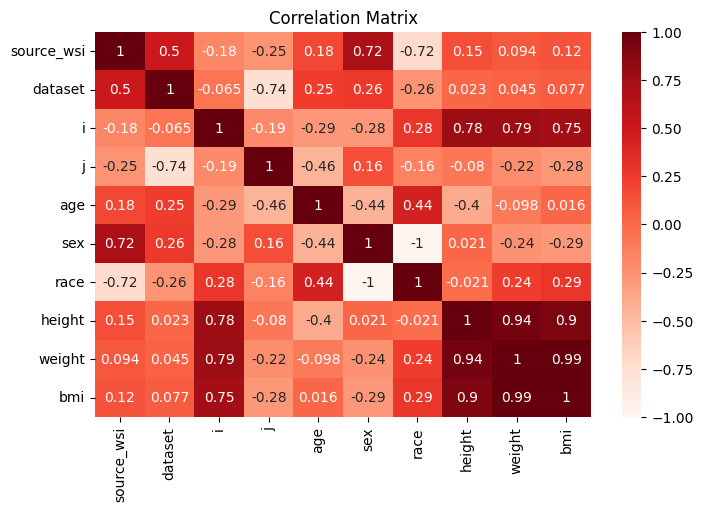

In [7]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
merged['sex'] = label_encoder.fit_transform(merged['sex'])
merged['race'] = label_encoder.fit_transform(merged['race'])

# Generate and display the correlation matrix for the features
cm = merged.iloc[:,1:].corr()
fig, axes = plt.subplots(1, 1, figsize=(8, 5))
sns.heatmap(cm, annot=True, ax=axes, cmap="Reds")
axes.set_title(f"Correlation Matrix")
plt.show()

Of course BMI is calculated from weight and height, so they have high correlation. The location features seems to be useful as well since j shows inverse relationship with dataset and i shows positive correlation with bmi features.

In [8]:
# Checking features by WSI
wsi_counts = {}
for i in range(4):
    wsi = merged.loc[merged.source_wsi==i+1]
    sr = wsi.iloc[0,6:8]
    print(f"WSI {i+1}. - sex: {sr[0]}, race: {sr[1]}, has {len(wsi)} tiles.")
    wsi_counts[i+1] = len(wsi)

WSI 1. - sex: 0, race: 1, has 507 tiles.
WSI 2. - sex: 0, race: 1, has 445 tiles.
WSI 3. - sex: 0, race: 1, has 410 tiles.
WSI 4. - sex: 1, race: 0, has 271 tiles.


/tmp/ipykernel_19/766842055.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f"WSI {i+1}. - sex: {sr[0]}, race: {sr[1]}, has {len(wsi)} tiles.")


This information indicates, that it will be hard to build a well-generalizing model based on 4 sources of images.
Also there is high sex/race imbalance since there is only 1 male, and that has the lowest amount of samples.

In [9]:
# Also important to note that there are 3x more samples annotated by non-experts
merged["dataset"].value_counts()

dataset
2    1211
1     422
Name: count, dtype: int64

In [10]:
# Based on these assumptions I will apply weights for samples,
# which will be handy for manipulating loss calculation
# (inversely proportional to sample count)

max_val = np.max(list(wsi_counts.values()))
for k,v in wsi_counts.items():
    wsi_counts[k] = round(max_val / v, 2)

# Also add a little more weight for ws4 since it has different sex/race attr.
wsi_counts[4] = 2.0 # calculated value 1.87
print(wsi_counts)

{1: 1.0, 2: 1.14, 3: 1.24, 4: 2.0}


In [11]:
# Same for dataset feature (also added log smoothing, since difference would be too much otherwise)
dataset_counts = {1: 422, 2: 1211}
max_val = 1211
merged["ds_weight"] = merged["dataset"].map(lambda x: 1 + np.log(max_val / dataset_counts.get(x, max_val)))
merged["wsi_weight"] = merged["source_wsi"].map(wsi_counts)
merged.head()

,id,source_wsi,dataset,i,j,age,sex,race,height,weight,bmi,ds_weight,wsi_weight
0,0006ff2aa7cd,2,2,16896,16420,56,0,1,175.2,139.6,45.5,1.000000,1.14
1,00168d1b7522,2,2,14848,14884,56,0,1,175.2,139.6,45.5,1.000000,1.14
2,0033bbc76b6b,1,1,10240,43008,58,0,1,160.0,59.0,23.0,2.054196,1.00
3,003504460b3a,3,2,8192,11776,73,0,1,162.3,87.5,33.2,1.000000,1.24
4,004daf1cbe75,3,2,6144,11264,73,0,1,162.3,87.5,33.2,1.000000,1.24


In [12]:
# Normalize weights and calculate final sample weight (equal contribution from both)
merged["wsi_weight_norm"] = merged["wsi_weight"] / merged["wsi_weight"].max()
merged["ds_weight_norm"] = merged["ds_weight"] / merged["ds_weight"].max()
merged["sample_weight"] = merged["wsi_weight_norm"] * merged["ds_weight_norm"] # Calculate sample weight
merged["sample_weight"] = merged["sample_weight"] / merged["sample_weight"].max() # Also normalize it

merged.drop(columns=["ds_weight_norm","wsi_weight_norm","ds_weight","wsi_weight"], axis=1, inplace=True)
merged.head(20)

,id,source_wsi,dataset,i,j,age,sex,race,height,weight,bmi,sample_weight
0,0006ff2aa7cd,2,2,16896,16420,56,0,1,175.2,139.6,45.5,0.486808
1,00168d1b7522,2,2,14848,14884,56,0,1,175.2,139.6,45.5,0.486808
2,0033bbc76b6b,1,1,10240,43008,58,0,1,160.0,59.0,23.0,0.877193
3,003504460b3a,3,2,8192,11776,73,0,1,162.3,87.5,33.2,0.529511
4,004daf1cbe75,3,2,6144,11264,73,0,1,162.3,87.5,33.2,0.529511
5,005715f0a313,3,2,8192,10752,73,0,1,162.3,87.5,33.2,0.529511
6,00654cc08aac,2,2,18944,12324,56,0,1,175.2,139.6,45.5,0.486808
7,00656c6f2690,1,1,10240,46080,58,0,1,160.0,59.0,23.0,0.877193
8,0067d5ad2250,2,1,23552,22528,56,0,1,175.2,139.6,45.5,1.000000
9,00ca2f4c8918,3,2,14336,7680,73,0,1,162.3,87.5,33.2,0.529511


## Parameter configurations


In [13]:
# Custom transformation for Test-Time Augmentation (TTA)
class TrackableRotate90:
    def __init__(self, k=None):
        self.k = k

    def apply(self, image):
        """ Applies the forward transformation. """
        assert self.k is not None, "Rotation k must be specified before applying transformation."
        return np.ascontiguousarray(np.rot90(image, k=self.k, axes=(0, 1))) # ensure contiguous memory layout

    def apply_inverse(self, image):
        """ Applies the inverse transformation."""
        assert self.k is not None, "Rotation k must be specified before applying inverse transformation."
        return np.ascontiguousarray(np.rot90(image, k=4 - self.k, axes=(0, 1))) # ensure contiguous memory layout

In [14]:
class CFG:
    # Dataset parameters
    base_path = "/kaggle/input/hubmap-hacking-the-human-vasculature/"
    images_folder = os.path.join(base_path, "train")
    labels_path = os.path.join(base_path, "polygons.jsonl")
    sample_size = None  # None if we need all data otherwise set the number of samples

    # Normalization of images
    # ImageNet stats
    # mean = [0.485, 0.456, 0.406]
    # std = [0.229, 0.224, 0.225]
    # Precalculated stats on this data
    mean = [0.043, 0.026, 0.039]
    std = [0.008, 0.013, 0.009]
    
    # Image augmentation setting for train set
    train_tfms = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.GaussianBlur(blur_limit=(3, 9), p=0.5),
        A.ElasticTransform(alpha=20, sigma=50, p=0.5),
        A.ShiftScaleRotate(shift_limit=0, scale_limit=(-0.2, 0.2), rotate_limit=0, interpolation=1, p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    ])

    # Test-time augmentation
    # Process: 1.Transform image 2.Predict with model 3.Reverse transformation on predictions
    # pairs like: (forward_tfm, reverse_tfm)
    tta_tfms = [
        (A.HorizontalFlip(p=1), A.HorizontalFlip(p=1)),
        (A.VerticalFlip(p=1), A.VerticalFlip(p=1)),
        (TrackableRotate90(), TrackableRotate90()),
        # (A.GaussianBlur(blur_limit=(3, 9), p=1), None),
        # (A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1), None),
    ]
    
    # Model related parameters
    img_size = 512     # size of sample image
    in_ch = 3          # input bands of an image
    num_classes = 3    # background + 2 classes
    filters = 16               # initial number of convolutional filters of the model
    mixed_precision = True     # mixing dtypes (float16 and float32) for faster computation
    conv_block_type = "concat" # "learn" for parameter learning, "concat" for concat+conv1x1 method or "normal"

    # Training hyperparameters
    epochs = 50              # number of training iterations
    batch_size = 16          # grouping samples for better calculation (memory and training speed tradeoff)
    init_lr = 1e-3           # initial learning rate for optimizer
    weight_decay = 1e-4      # regularization parameter
    early_stopping = 7       # patience in case of training decline
    lr_patience = 1          # patience for changing the learning in case of training decline
    lr_factor = 0.3          # rate of change in case of training decline
    t_max = 8                # cosine annealing parameter (for cyclical learning rate)
    eta_min = 5e-7           # cosine annealing minimum learning rate
    pct_start = 0.3          # percentage of the cycle used for increasing the lr
    scheduler_type = "onec"  # use 'ca' for cosine annealing, 'rop' for reduce lr on plateau, 'onec' for one cycle policy

    # Dictionaries for statistics and other mapping options
    cls_dict = {"background":0, "blood_vessel":1, "glomerulus":2}
    cnt_dict = {"background":0, "blood_vessel":0, "glomerulus":0}

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:87: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


## Custom dataset

In order to load in and prepare the images and masks, we need to create a Pytorch specific dataset class.


In [15]:
class HubMap_Dataset(Dataset):
    def __init__(self, image_dir, labels_file, meta_df, precomputed_df=None, indices=None):
        self.image_dir = image_dir
        self.labels_file = labels_file
        self.meta_df = meta_df
        self.indices = indices
        self.augmentation = None

        if precomputed_df is not None:
            full_dataset = precomputed_df
        else:
            full_dataset = HubMap_Dataset.create_dataframe(labels_file, meta_df)

        self.dataset = full_dataset if self.indices is None else full_dataset.iloc[self.indices].reset_index(drop=True)
    
    @staticmethod
    def coordinates_to_mask(coordinate_list, class_num):
        """ Convert polygon coordinates to a mask with a specific class label. """
        mask = np.zeros((512, 512), dtype=np.uint8)
        for coord in coordinate_list:
            cv2.fillPoly(mask, [np.array(coord)], class_num)
        return mask
    
    @staticmethod
    def create_dataframe(labels_file, meta_df):
        """ 
        Preprocess the labels by reading from the JSON file, creating masks,
        and storing image ids and their corresponding label-encoded masks in a pandas DataFrame.
        """
        with open(labels_file) as json_file:
            json_list = list(json_file)

        # Loop through the annotations
        dataset = []
        for json_str in json_list:
            json_mask_data = json.loads(json_str)
            img_id = json_mask_data['id']
            annotations = json_mask_data['annotations']
            
            # Initialize a mask array
            mask = np.zeros((512, 512), dtype=np.uint8)
            
            # Assign class labels
            for ann in annotations:
                if ann["type"] == "blood_vessel":
                    class_num = 1  # Class 1 for blood vessel
                elif ann["type"] == "glomerulus":
                    class_num = 2  # Class 2 for glomerulus
                else: continue  # Skip 'unsure'
                
                # Convert coordinates to a mask for the given class
                class_mask = HubMap_Dataset.coordinates_to_mask(ann["coordinates"], class_num)
                mask = np.maximum(mask, class_mask)  # Combine masks for different classes
                # it does overwrite the overlapping pixels, but the intersection of classes is insignificant

            dataset.append({"id": img_id, "mask": mask})
        
        df = pd.DataFrame(dataset)
        final_df = df.merge(meta_df, on=["id"], how="left") # Join with meta
        return final_df

    def apply_augs(self, tfms):
        self.augmentation = tfms
    
    def __len__(self):
        """ Return the length of the dataset. """
        return len(self.dataset)

    def __getitem__(self, idx):
        """ Get an image and its corresponding label-encoded mask by index. """
        data = self.dataset.iloc[idx]
        img_id = data['id']
        image_path = f"{self.image_dir}/{img_id}.tif"
        image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)
        mask = data['mask']
        
        # Apply augmentations if necessary
        if self.augmentation is not None:
            augmented = self.augmentation(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']

        # Normalize the images and prepare tensors
        image_scaled = np.array(image) / 255.0
        image_normed = (image_scaled - CFG.mean) / CFG.std
        image_t = torch.tensor(image_normed, dtype=torch.float32).permute(2, 0, 1)  # Convert to (C, H, W)
        mask_t = torch.tensor(mask, dtype=torch.long).unsqueeze(0)  # (1, H, W) (CE loss assumes the mask as integers)
        sample_weight = data['sample_weight']

        return image_t, mask_t, img_id, sample_weight

### Dataset separation:
Since there are 1633 labeled samples, I will split the dataset like the following (saving test ids for later use):
- training and validation data 0-1617
- test data 1617-1633 (size of 1 batch)

In [16]:
# Create and shuffle the dataset (if there is some logical ordering among the samples)
df = HubMap_Dataset(CFG.images_folder, CFG.labels_path, meta_df=merged)
shuffled_indices = np.random.permutation(len(df.dataset))
df.dataset = df.dataset.iloc[shuffled_indices].reset_index(drop=True)

# Create datasets and dataloaders
test_range = np.arange(1617,1633)
test_dataset = HubMap_Dataset(CFG.images_folder, CFG.labels_path, meta_df=merged, precomputed_df=df.dataset, indices=test_range)
test_dataset.dataset.id.to_csv("baseline_test_ids.csv", index=False) # save baseline ids to file
print(f"test size: {len(test_dataset)}")

test_loader = DataLoader(test_dataset, batch_size=CFG.batch_size, shuffle=False, num_workers=2, pin_memory=True, drop_last=False)
oneb = next(iter(test_loader)) # take one batch to illustrate the dataloader shape
ims, lbs, _, _ = oneb
print(f"images: {ims.shape, ims.dtype, ims.device}\nmasks: {lbs.shape, lbs.dtype, lbs.device}")

test size: 16
images: (torch.Size([16, 3, 512, 512]), torch.float32, device(type='cpu'))
masks: (torch.Size([16, 1, 512, 512]), torch.int64, device(type='cpu'))


I was thinking about normalizing and adding all features weighted form to contribute to the sample_weight, but it would be probably too much manipulation on the training loss and validation loss would increase a lot (same phenomenon happens with too much TTA).

In [17]:
# Checking the dataset
cols = [x for x in df.dataset.columns if x!="mask"]
df.dataset[cols].head(10)

,id,source_wsi,dataset,i,j,age,sex,race,height,weight,bmi,sample_weight
0,c701b51b6ece,3,2,8704,2560,73,0,1,162.3,87.5,33.2,0.529511
1,93c8f228d228,2,2,22528,15396,56,0,1,175.2,139.6,45.5,0.486808
2,7f61489d23e1,3,2,4096,10752,73,0,1,162.3,87.5,33.2,0.529511
3,3b0d08f3e37a,4,2,13312,26112,53,1,0,166.0,73.0,26.5,0.854050
4,2b1cf5bbc9ea,4,2,3584,26624,53,1,0,166.0,73.0,26.5,0.854050
5,359bb86fa14f,1,1,9216,45568,58,0,1,160.0,59.0,23.0,0.877193
6,960fed572dd3,3,2,13312,5120,73,0,1,162.3,87.5,33.2,0.529511
7,cc8d5b6d4975,3,2,11776,7680,73,0,1,162.3,87.5,33.2,0.529511
8,8a6e6fb756da,1,1,10752,40448,58,0,1,160.0,59.0,23.0,0.877193
9,5ad6f7d64002,2,2,20992,14884,56,0,1,175.2,139.6,45.5,0.486808


### Visualizations and descriptive statistics

After we prepared the data it is important to visualize the images and masks for better understanding and extracting further informations.


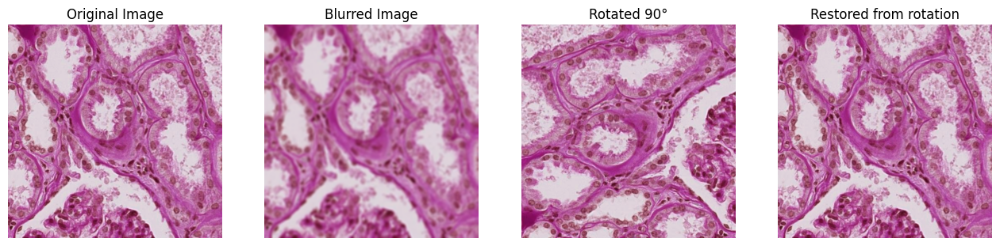

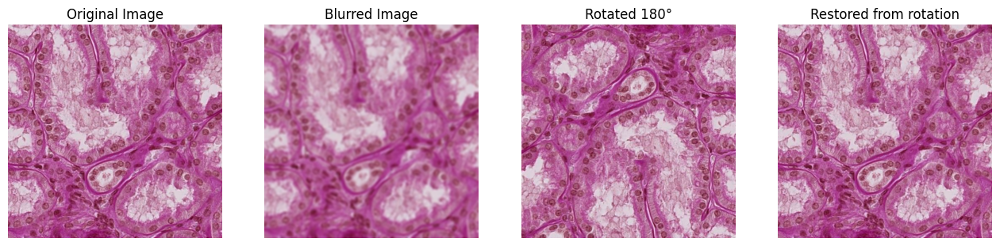

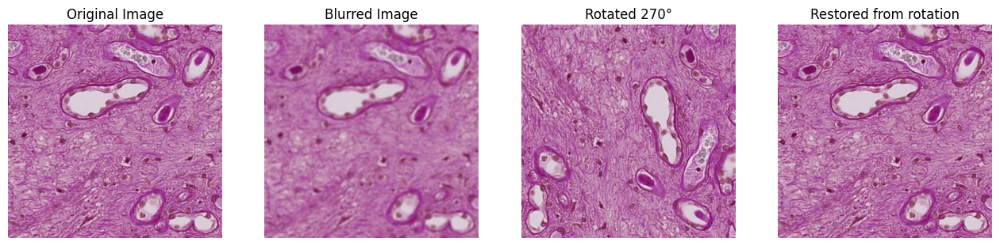

In [18]:
# The following visualization serves as a proof that the custom TTA transformations are working
def reverse_norm(image, mean, std):
    """ Reverse normalization for visualization. """
    mean = np.array(mean).reshape(1, 1, 3)
    std = np.array(std).reshape(1, 1, 3)
    image = (image * std) + mean
    return np.clip(image, 0, 1)

def visualize_tta_tfms(image, k):
    """Test transformations."""
    
    image = reverse_norm(image, CFG.mean, CFG.std)    
    image = np.clip(image * 255, 0, 255).astype(np.uint8)
    
    blur = A.GaussianBlur(sigma_limit=(2.5,3.0), blur_limit=(7, 9), p=1)
    blur_img = blur(image=image)['image']
    
    rot = TrackableRotate90(k)
    changed = rot.apply(image)
    restored = rot.apply_inverse(changed)
    
    fig, axes = plt.subplots(1, 4, figsize=(16, 10))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")
    axes[1].imshow(blur_img)
    axes[1].set_title("Blurred Image")
    axes[1].axis("off")
    axes[2].imshow(changed)
    axes[2].set_title(f"Rotated {k * 90}°")
    axes[2].axis("off")
    axes[3].imshow(restored)
    axes[3].set_title("Restored from rotation")
    axes[3].axis("off")
    plt.show()

# Test the transformations
samples = [test_dataset[i] for i in range(3)]
for sample, k in zip(samples, [1,2,3]):
    image = sample[0].permute(1, 2, 0).numpy()
    visualize_tta_tfms(image, k)

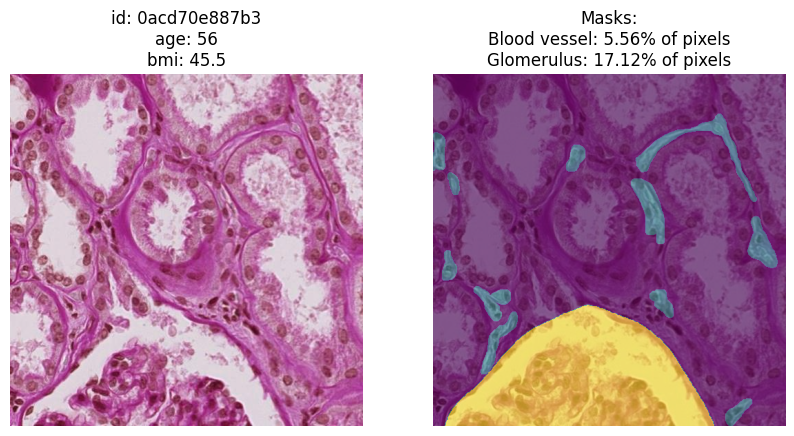

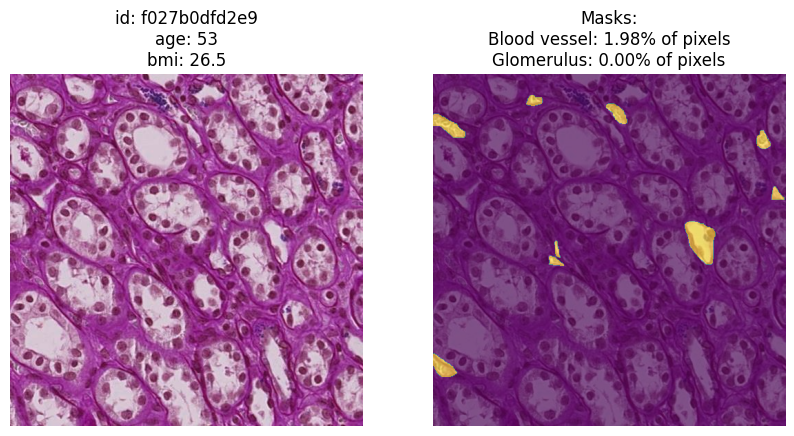

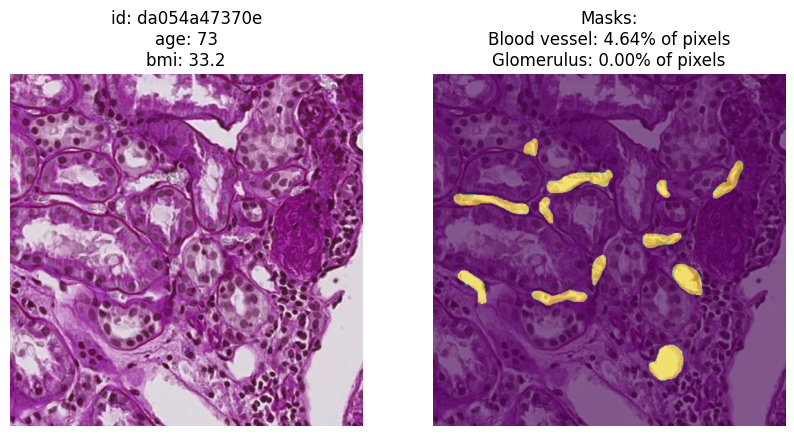

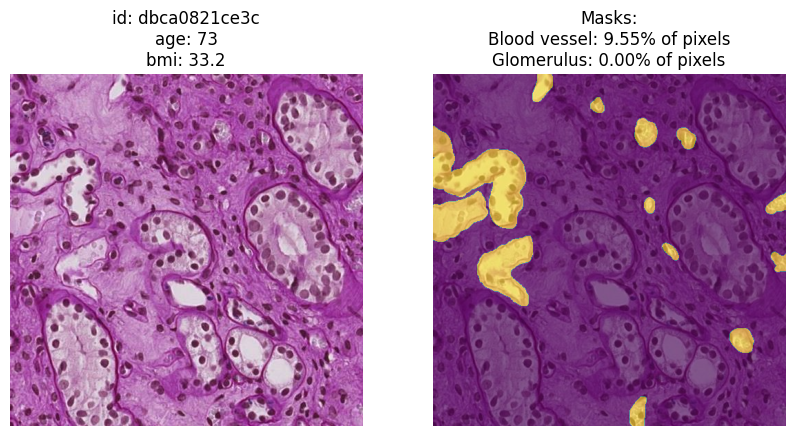

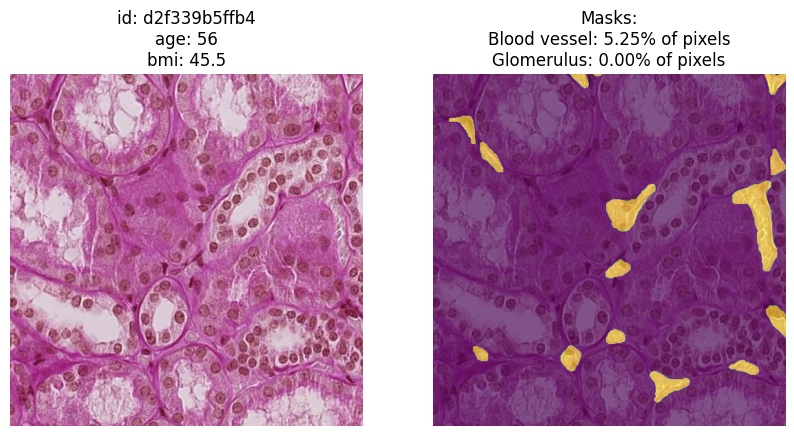

In [19]:
def visualize_sample(sample):
    """ Visualize image, mask, and class ratios """
    masks = sample[1].permute(1, 2, 0).numpy()
    image = sample[0].permute(1, 2, 0).numpy()
    image = reverse_norm(image, CFG.mean, CFG.std)

    age = df.dataset.loc[df.dataset["id"]==sample[2], "age"].values[0]
    bmi = df.dataset.loc[df.dataset["id"]==sample[2], "bmi"].values[0]
    
    # Visualize
    fig, axs = plt.subplots(1, 2, figsize=(10, 7))
    axs[0].imshow(image)
    axs[0].set_title(f"id: {sample[2]}\nage: {age}\nbmi: {bmi}")
    axs[0].axis("off")
    axs[1].imshow(image)
    axs[1].imshow(masks, alpha=0.6)
    axs[1].axis("off")

    # Calculate pixel ratios for each class
    total_pixels = 512*512
    class_pixel_counts = {class_num: np.sum(masks == class_num) for class_num in CFG.cls_dict.values() if class_num!=0 }
    class_ratios = {class_num: count / total_pixels for class_num, count in class_pixel_counts.items()}

    # Display class names and their pixel ratios
    mask_info = []
    for class_num, ratio in class_ratios.items():
        class_name = "Blood vessel" if class_num == 1 else "Glomerulus"
        mask_info.append(f"{class_name}: {ratio:.2%} of pixels")            
    axs[1].set_title(f"Masks:\n{mask_info[0]}\n{mask_info[1]}")
    plt.show()

# Visualize a few samples
samples = [test_dataset[-i] for i in range(5)]
for sample in samples:
    visualize_sample(sample)

## U-Net model

As the baseline model, I chose the U-Net architecture, which was specifically designed for medical image segmentation..

**Structure**:

Repetatively applies convolution layers, ReLU acitvation and max pooling operation in its core block.
It is built with a 4-level architecture and a bottleneck, where there is a down- and an upsampling path to explore image instances in different dimensional space. It also applies a skip connection layer in every level to support the feature interpretation in the different image dimensions.

**Application**:

U-Net is widely used across a variety of fields, from medical image segmentation to satellite imaging.

#### Customized U-Net model

In my implementation I made some extra changes to the original U-Net in order to improve performance:
- Adding 1 extra feature map level (improved accuracy a little bit)
- Improved convolutions: I made two different convolution solutions to explore which one would be more efficient. ConcatConvBlock gave better results, so I accepted it as the basis for the final modeling.
- Test-Time Augmentation: For better generalization purposes I also added TTA.

In [20]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv(x)

class LearnConvBlock(nn.Module):
    """ A hybrid approach to test different receptive fields (3x3k, 5x5k, 3x3k with dilation),
        also letting the model decide their contribution by adjusting learnable parameters.
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv3x3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv5x5 = nn.Conv2d(in_channels, out_channels, kernel_size=5, padding=2)
        self.conv_dilated = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=2, dilation=2)

        # Batchnorm for each path
        self.bn3x3 = nn.BatchNorm2d(out_channels)
        self.bn5x5 = nn.BatchNorm2d(out_channels)
        self.bn_dilated = nn.BatchNorm2d(out_channels)
        
        # Learnable parameters to let the model decide which Conv layer is more advantageous 
        self.w = nn.Parameter(torch.tensor([1.0,1.0,1.0]))

    def forward(self, x):
        x1 = self.bn3x3(self.conv3x3(x))
        x2 = self.bn5x5(self.conv5x5(x))
        x3 = self.bn_dilated(self.conv_dilated(x))
        w_softmax = F.softmax(self.w, dim=0) # Ensures they add up to 1
        x_weighted = w_softmax[0] * x1 + w_softmax[1] * x2 + w_softmax[2] * x3
        return F.relu(x_weighted)

class ConcatConvBlock(nn.Module):
    """ A hybrid approach using concatenation + 1x1 conv to learn best feature combination."""
    def __init__(self, in_channels, out_channels, level):
        super().__init__()

        assert level in [1,2,3,4], 'Level value must be in [1,2,3,4]'
        self.level = level
                        
        self.conv3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(in_channels, out_channels, kernel_size=5, padding=2)
        self.conv3_dil = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=2, dilation=2)
        self.conv5_dil = nn.Conv2d(in_channels, out_channels, kernel_size=5, padding=4, dilation=2)
        self.conv7 = nn.Conv2d(in_channels, out_channels, kernel_size=7, padding=3)
        
        # Batchnorm for each feature map
        self.bn3 = nn.BatchNorm2d(out_channels)
        self.bn5 = nn.BatchNorm2d(out_channels)
        self.bn3_dil = nn.BatchNorm2d(out_channels)
        self.bn5_dil = nn.BatchNorm2d(out_channels)
        self.bn7 = nn.BatchNorm2d(out_channels)

        # Let a 1x1 learner layer decide which output is best
        if self.level == 1:
            self.combine = nn.Conv2d(3 * out_channels, out_channels, kernel_size=1)
        if self.level in [2,3]:
            self.combine = nn.Conv2d(3 * out_channels, out_channels, kernel_size=1)
        if self.level == 4:
            self.combine = nn.Conv2d(2 * out_channels, out_channels, kernel_size=1)

    def forward(self, x):
        if self.level == 1:
            x1 = F.relu(self.bn3(self.conv3(x)))
            x2 = F.relu(self.bn5(self.conv5(x)))
            x3 = F.relu(self.bn7(self.conv7(x)))
            comb = self.combine(torch.cat([x1,x2,x3],dim=1))
            return F.relu(comb)

        if self.level in [2,3]:
            x1 = F.relu(self.bn3(self.conv3(x)))
            x2 = F.relu(self.bn3_dil(self.conv3_dil(x)))
            x3 = F.relu(self.bn5(self.conv5(x)))
            comb = self.combine(torch.cat([x1,x2,x3],dim=1))
            return F.relu(comb)

        if self.level == 4:
            x1 = F.relu(self.bn3_dil(self.conv3_dil(x)))
            x2 = F.relu(self.bn5_dil(self.conv5_dil(x)))
            comb = self.combine(torch.cat([x1,x2],dim=1))
            return F.relu(comb)

class UNet(nn.Module):
    def __init__(self, in_channels=3, in_filters=32, num_classes=4, conv_block_type='normal', tta_transforms=None):
        super().__init__()

        self.num_classes = num_classes
        self.conv_block_type = conv_block_type
        self.tta_transforms = tta_transforms

        def get_conv_block(in_c, out_c, level):
            """ Helper to select ConvBlock type. """
            if self.conv_block_type == 'learn': return LearnConvBlock(in_c, out_c)
            elif self.conv_block_type == 'concat': return ConcatConvBlock(in_c, out_c, level)
            else: return ConvBlock(in_c, out_c)
        
        def init_weights(m):
            if isinstance(m, nn.Conv2d):
                torch.nn.init.kaiming_uniform_(m.weight, nonlinearity="relu")
                m.bias.data.fill_(0.01)
                
        # Encoder
        self.encoder1 = get_conv_block(in_channels, in_filters, level=1)
        self.pool1 = nn.MaxPool2d(2)
        self.encoder2 = get_conv_block(in_filters, in_filters * 2, level=2)
        self.pool2 = nn.MaxPool2d(2)
        self.encoder3 = get_conv_block(in_filters * 2, in_filters * 4, level=3)
        self.pool3 = nn.MaxPool2d(2)
        self.encoder4 = get_conv_block(in_filters * 4, in_filters * 8, level=4)
        self.pool4 = nn.MaxPool2d(2)

        # Bottleneck
        self.bottleneck = get_conv_block(in_filters * 8, in_filters * 16, level=4)

        # Decoder
        self.upconv4 = nn.ConvTranspose2d(in_filters * 16, in_filters * 8, 2, stride=2, output_padding=0)
        self.decoder4 = get_conv_block(in_filters * 16, in_filters * 8, level=4)
        self.upconv3 = nn.ConvTranspose2d(in_filters * 8, in_filters * 4, 2, stride=2)
        self.decoder3 = get_conv_block(in_filters * 8, in_filters * 4, level=3)
        self.upconv2 = nn.ConvTranspose2d(in_filters * 4, in_filters * 2, 2, stride=2)
        self.decoder2 = get_conv_block(in_filters * 4, in_filters * 2, level=2)
        self.upconv1 = nn.ConvTranspose2d(in_filters * 2, in_filters, 2, stride=2)
        self.decoder1 = get_conv_block(in_filters * 2, in_filters, level=1)

        # Classifier
        self.final_clf = nn.Conv2d(in_filters, num_classes, 1)
        self.apply(init_weights)

    def forward_normal(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))
        
        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.decoder4(torch.cat([self.upconv4(bottleneck), enc4], dim=1))
        dec3 = self.decoder3(torch.cat([self.upconv3(dec4), enc3], dim=1))
        dec2 = self.decoder2(torch.cat([self.upconv2(dec3), enc2], dim=1))
        dec1 = self.decoder1(torch.cat([self.upconv1(dec2), enc1], dim=1))

        return self.final_clf(dec1)
    
    def tta(self, x, rotation_pair=None):
        """ Apply test-time augmentation and return the averaged prediction. """
        predictions = []
        x_np = x.permute(1, 2, 0).cpu().numpy() # C,H,W currently -> H,W,C

        for forward_tfm, reverse_tfm in self.tta_transforms:
            x_tfmd = np.ascontiguousarray(x_np) # ensure contiguous memory layout

            if isinstance(forward_tfm, TrackableRotate90):
                if rotation_pair:
                    forward_tfm = TrackableRotate90(rotation_pair[0])
                    reverse_tfm = TrackableRotate90(rotation_pair[1])
                x_tfmd = forward_tfm.apply(x_tfmd)
            # otherwise apply albumentation tfms:
            elif isinstance(forward_tfm, (A.GaussianBlur, A.RandomBrightnessContrast)):
                x_tfmd = reverse_norm(x_tfmd, CFG.mean, CFG.std) # denormalize it
                x_tfmd = np.clip(x_tfmd * 255, 0, 255).astype(np.uint8) # rescale
                x_tfmd = forward_tfm(image=x_tfmd)['image']
                x_tfmd = ((x_tfmd / 255.0) - CFG.mean) / CFG.std # normalize
                predictions.append(self._predict(x_tfmd, no_reverse=True))
                continue
            else:
                x_tfmd = forward_tfm(image=x_tfmd)['image'] # for HorizontalFlip, VerticalFlip

            predictions.append(self._predict(x_tfmd, reverse_tfm))

        final_output = torch.from_numpy(np.stack(predictions).mean(axis=0)).float() # [H,W,C * N] -> H,W,C
        final_output = final_output.permute(2, 0, 1).unsqueeze(0).to(device) # H,W,C -> 1,C,H,W
        return final_output

    def _predict(self, x_transformed, reverse_tfm=None, no_reverse=False):
        x_transformed = np.ascontiguousarray(x_transformed).astype(np.float32)
        x_transformed = torch.from_numpy(x_transformed).permute(2, 0, 1).unsqueeze(0).to(device) # 1,C,H,W->H,W,C
        pred = torch.sigmoid(self.forward_normal(x_transformed)).squeeze(0).permute(1, 2, 0).cpu().numpy()

        if not no_reverse: # apply reverse tfm
            pred = reverse_tfm.apply_inverse(pred) if isinstance(reverse_tfm, TrackableRotate90) else reverse_tfm(image=pred)['image']
        return pred
    
    def forward(self, x, apply_tta=False, rotation_pair=None):
        """ Use normal forward for training and TTA forward in validation. """
        if apply_tta:
            bs = x.shape[0] # start as (bs,c,h,w)
            results = [self.tta(x[i], rotation_pair) for i in range(bs)] # input as (c,h,w)
            return torch.cat(results, dim=0) # [1,C,H,W * N] -> BS,C,H,W
        else: return self.forward_normal(x)


In [21]:
# Create Custom Unet
c_unet_model = UNet(in_filters=CFG.filters, num_classes=CFG.num_classes, conv_block_type=CFG.conv_block_type, tta_transforms=CFG.tta_tfms)
c_unet_model.to(device)

# # Test model on dummy input
summary(c_unet_model, input_size=(1,3,512,512), col_names=['input_size','output_size','num_params','trainable'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Trainable
UNet                                     [1, 3, 512, 512]          [1, 3, 512, 512]          --                        True
├─ConcatConvBlock: 1-1                   [1, 3, 512, 512]          [1, 16, 512, 512]         1,728                     True
│    └─Conv2d: 2-1                       [1, 3, 512, 512]          [1, 16, 512, 512]         448                       True
│    └─BatchNorm2d: 2-2                  [1, 16, 512, 512]         [1, 16, 512, 512]         32                        True
│    └─Conv2d: 2-3                       [1, 3, 512, 512]          [1, 16, 512, 512]         1,216                     True
│    └─BatchNorm2d: 2-4                  [1, 16, 512, 512]         [1, 16, 512, 512]         32                        True
│    └─Conv2d: 2-5                       [1, 3, 512, 512]          [1, 16, 512, 512]         2,368                     True
│  

## UNeXt model

UNeXt introduces a successful lightweight modelling approach for medical image segmentation. It uses Multi-Layer Perceptron based architectures with skip connections. They also demonstrated that UNeXt outperformed several segmentation models like UNet and UNet++.

Reference code: https://github.com/jeya-maria-jose/UNeXt-pytorch/tree/main

Reference paper: https://arxiv.org/abs/2203.04967

In [22]:
!git clone https://github.com/jeya-maria-jose/UNeXt-pytorch && \
cd /kaggle/working/UNeXt-pytorch && \
sed -i 's/^\(from mmcv.cnn import ConvModule\)/# \1/' archs.py  # (not used anywhere in the file, and takes too much time to install)

Cloning into 'UNeXt-pytorch'...
remote: Enumerating objects: 62, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 62 (delta 21), reused 21 (delta 21), pack-reused 32 (from 1)
Receiving objects: 100% (62/62), 626.40 KiB | 5.96 MiB/s, done.
Resolving deltas: 100% (22/22), done.


In [23]:
import sys
sys.path.append("/kaggle/working/UNeXt-pytorch")
from archs import UNext

/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [24]:
unext_model = UNext(num_classes=CFG.num_classes)
unext_model.to(device)
summary(unext_model, input_size=(1,3,512,512), col_names=['input_size','output_size','num_params','trainable'])

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Trainable
UNext                                    [1, 3, 512, 512]          [1, 3, 512, 512]          --                        True
├─Conv2d: 1-1                            [1, 3, 512, 512]          [1, 16, 512, 512]         448                       True
├─BatchNorm2d: 1-2                       [1, 16, 512, 512]         [1, 16, 512, 512]         32                        True
├─Conv2d: 1-3                            [1, 16, 256, 256]         [1, 32, 256, 256]         4,640                     True
├─BatchNorm2d: 1-4                       [1, 32, 256, 256]         [1, 32, 256, 256]         64                        True
├─Conv2d: 1-5                            [1, 32, 128, 128]         [1, 128, 128, 128]        36,992                    True
├─BatchNorm2d: 1-6                       [1, 128, 128, 128]        [1, 128, 128, 128]        256                       True
├─O

## Swin Transformer model

The Swin Transformer is a type of Vision Transformer. It builds hierarchical feature maps by merging image patches in deeper layers and has linear computation complexity to input image size due to computation of self-attention only within each local window. It can thus serve as a general-purpose backbone for both image classification and dense recognition tasks. In contrast, previous vision Transformers produce feature maps of a single low resolution and have quadratic computation complexity to input image size due to computation of self-attention globally (Huggingface description).

paper: https://arxiv.org/abs/2103.14030

pretrained model: https://huggingface.co/microsoft/swin-large-patch4-window12-384


#### Customized Swin Transformer segmentation model

In order to properly use the Swin Transformer for image segmentation purposes, I supplemented the encoder with a U-Net-like decoder.

In [25]:
from transformers import SwinModel

class UPCBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels, kernel_size):
        super().__init__()
        padding = kernel_size // 2
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels + skip_channels, out_channels, kernel_size=kernel_size, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x, skip=None):
        x = self.upsample(x)
        if skip is not None:
            if x.shape[2:] != skip.shape[2:]:
                skip = F.interpolate(skip, size=x.shape[2:], mode='bilinear', align_corners=False)
            x = torch.cat([x, skip], dim=1)
        return self.conv(x)

class SegDecoder(nn.Module):
    def __init__(self, skip_channels, num_classes=3):
        super().__init__()
        self.up1 = UPCBlock(in_channels=1536, skip_channels=1536, out_channels=512, kernel_size=3)  # 16 -> 32
        self.up2 = UPCBlock(in_channels=512, skip_channels=768, out_channels=256, kernel_size=3)    # 32 -> 64
        self.up3 = UPCBlock(in_channels=256, skip_channels=384, out_channels=128, kernel_size=3)    # 64 -> 128
        self.up4 = UPCBlock(in_channels=128, skip_channels=192, out_channels=64, kernel_size=5)     # 128 -> 256
        self.up5 = UPCBlock(in_channels=64, skip_channels=0, out_channels=32, kernel_size=7)        # 256 -> 512
        self.final = nn.Conv2d(32, num_classes, kernel_size=1)

    def forward(self, x, skips):
        x = self.up1(x, skips[0]) # 16->32, stage1 = [B, 1536, 32, 32] (skip) 
        x = self.up2(x, skips[1]) # 32->64, stage2 = [B, 768, 64, 64] (skip)
        x = self.up3(x, skips[2]) # 64->128, stage3 = [B, 384, 128, 128] (skip)
        x = self.up4(x, skips[3]) # 128->256, stem = [B, 192, 256, 256] (skip)
        x = self.up5(x, None)     # 256->512 (no skip)
        return self.final(x)

class SwinSegmentationModel(nn.Module):
    def __init__(self, num_classes=3):
        super().__init__()
        self.encoder = SwinModel.from_pretrained(
            "microsoft/swin-large-patch4-window12-384",
            output_hidden_states=True
        )

        for param in self.encoder.parameters():
            param.requires_grad = False

        # skip_channels aligned with: [stage1, stage2, stage3, stem]
        self.decoder = SegDecoder(skip_channels=[1536, 768, 384, 192], num_classes=num_classes)

    def forward(self, x):
        out = self.encoder(x)
        features = out.last_hidden_state   # [B, N, 1536]
        hidden_states = out.hidden_states  # List of [B, N, C]

        def reshape_feats(feats):
            B, N, C = feats.shape
            S = int(N ** 0.5)
            return feats.permute(0, 2, 1).reshape(B, C, S, S)

        x = reshape_feats(features)  # [B, 1536, 16, 16]
        skips = [reshape_feats(h) for h in hidden_states[-5:-1]][::-1] # extract 4 stages in reverse order
        return self.decoder(x, skips)

2025-05-26 10:37:29.209245: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748255849.424737      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748255849.488319      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [26]:
# Build SwinSegModel
sws_model = SwinSegmentationModel(num_classes=CFG.num_classes)
sws_model.to(device)
summary(sws_model, input_size=(1,3,512,512), col_names=['input_size','output_size','num_params','trainable'])

config.json:   0%|          | 0.00/71.8k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/791M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/791M [00:00<?, ?B/s]

Layer (type:depth-idx)                                            Input Shape               Output Shape              Param #                   Trainable
SwinSegmentationModel                                             [1, 3, 512, 512]          [1, 3, 512, 512]          --                        Partial
├─SwinModel: 1-1                                                  [1, 3, 512, 512]          [1, 192, 128, 128]        --                        False
│    └─SwinEmbeddings: 2-1                                        [1, 3, 512, 512]          [1, 16384, 192]           --                        False
│    │    └─SwinPatchEmbeddings: 3-1                              [1, 3, 512, 512]          [1, 16384, 192]           (9,408)                   False
│    │    └─LayerNorm: 3-2                                        [1, 16384, 192]           [1, 16384, 192]           (384)                     False
│    │    └─Dropout: 3-3                                          [1, 16384, 192]           [1

## Training

In [27]:
class DiceCELoss(nn.Module):
    """ Combined loss function, utilizing CE and Dice losses. 
        In UneXt paper (https://arxiv.org/abs/2203.04967), they suggest reducing CE by weight=0.5.
    """
    def __init__(self, weight=None, reduction_factor=None, smooth=1e-8):
        super().__init__()
        self.weight = weight
        self.reduction_factor = reduction_factor
        self.smooth = smooth

    def forward(self, outputs, targets, sample_weights=None):
        bs, num_classes, h, w = outputs.shape  # outputs: [bs, num_classes, H, W]
        
        # Cross-Entropy Loss
        ce_loss = F.cross_entropy(outputs, targets.squeeze(1), weight=self.weight, reduction="none")  # (bs, H, W)

        # Convert targets to one-hot
        targets_one_hot = torch.zeros(bs, num_classes, h, w, device=outputs.device)
        targets_one_hot.scatter_(1, targets, 1)  # One-hot encode along class axis

        # Softmax over classes for probabilities
        probs = F.softmax(outputs, dim=1)  # (bs, num_classes, H, W)

        # Compute Dice Loss
        intersection = torch.sum(probs * targets_one_hot, dim=(2, 3))  # Sum over spatial dims
        union = torch.sum(probs, dim=(2, 3)) + torch.sum(targets_one_hot, dim=(2, 3))
        dice_loss = 1 - (2.0 * intersection + self.smooth) / (union + self.smooth)  # (bs, num_classes)

        # Reduce spatially before weighting
        ce_loss = ce_loss.mean(dim=(1, 2))  # (bs,)
        dice_loss = dice_loss.mean(dim=1)  # Reduce across classes, shape: (bs,)

        # Apply sample weights
        if sample_weights is not None:
            ce_loss = (ce_loss * sample_weights).mean()
            dice_loss = (dice_loss * sample_weights).mean()
        else:
            ce_loss = ce_loss.mean()
            dice_loss = dice_loss.mean()

        # Final loss combination
        combined_loss = self.reduction_factor * ce_loss + dice_loss if self.reduction_factor else ce_loss + dice_loss

        return combined_loss

In [28]:
def dice_score(pred_class_i, labels_i):
    """ Calculate Dice score as metric. """
    dice = (2 * (pred_class_i * labels_i).sum().item()) / ((pred_class_i + labels_i).sum().item() + 1e-8)
    return dice

def calc_stats(labels, preds, class_dict):
    """ Calculate the overall and class-related statistics."""
    labels = labels.squeeze(1) # to have H,W only
    pixel_acc = {}
    dice_scores = {}
    ious = {}

    pred_class = torch.argmax(preds, dim=1)
    
    for class_name, class_id in class_dict.items():
        if class_name == "background":
            continue

        # Index to predictions and labels
        pred_class_i = (pred_class == class_id).float().flatten()
        labels_i = (labels == class_id).float().flatten()
        
        # Calculate iou and dice score
        intersection = (pred_class_i * labels_i).sum().item()
        union = (pred_class_i + labels_i).sum().item() - intersection
        num_correct = (pred_class_i == labels_i).sum().item()
        num_pixels = labels_i.numel()

        # Calculate stats for each class
        if union > 0:
            pixel_acc[class_name] = num_correct / num_pixels * 100
            ious[class_name] = intersection / union * 100
            dice_scores[class_name] = dice_score(pred_class_i, labels_i)
        else:
            pixel_acc[class_name] = 0
            ious[class_name] = 0        
            dice_scores[class_name] = 0

    return dice_scores, ious, pixel_acc

def model_trainer(train_loader, valid_loader, model, loss_fn, optimizer, scheduler, early_stop_patience, tta=False, model_name="custom_unet"):

    torch.cuda.empty_cache()
    scaler = torch.GradScaler(device.type) if CFG.mixed_precision else None
    early_stopping_counter = 0
    prev_iou = -np.Inf
    prev_loss = np.Inf
        
    history = {
        "epoch": [],
        "train_loss": [],
        "valid_loss": [],
        "p_acc": [],
        "d_score": [],
        "iou": [],
        "background": { "d_score":[], "iou":[],},
        "blood_vessel": { "d_score":[], "iou":[],},
        "glomerulus": { "d_score":[], "iou":[],},
    }

    start = datetime.now()
    for e in range(CFG.epochs):

        # ---- TRAINING ----
        model.train()
        print("-" * 40)
        print(f"EPOCH {e + 1}. training step...")
        train_time_1 = datetime.now()
        loss_list = []

        for i, data in enumerate(train_loader):
            im = data[0].to(device)
            seg_gt = data[1].to(device)
            sample_ws = data[3].to(device)
            
            with torch.autocast(device.type):
                if model_name == "custom_unet":
                    seg_pred = model.forward(im, apply_tta=False)
                else:
                    seg_pred = model.forward(im)
                loss = loss_fn(seg_pred, seg_gt, sample_ws)

            # Backward and optimize
            optimizer.zero_grad()
            if CFG.mixed_precision:
                scaler.scale(loss.mean()).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                loss.backward()
                optimizer.step()
            if isinstance(scheduler, torch.optim.lr_scheduler.OneCycleLR):
                scheduler.step()

            # Collect losses
            loss_list.append(loss.item())

        train_time_2 = datetime.now()- train_time_1
        print(f" - epoch training time: (hh:mm:ss:ms): {train_time_2}\n")
        
        # ---- VALIDATION ----
        model.eval()
        print(f"EPOCH {e + 1}. validation step...")
        val_time_1 = datetime.now()
        val_loss_list = []
        all_dice_scores = {class_name: 0 for class_name in CFG.cls_dict.keys()}
        all_iou = {class_name: 0 for class_name in CFG.cls_dict.keys()}
        all_pixel_acc = {class_name: 0 for class_name in CFG.cls_dict.keys()}

        for i, data in enumerate(valid_loader):
            im = data[0].to(device)
            seg_gt = data[1].to(device)

            with torch.no_grad():
                if model_name == "unet" and tta:
                    if i%3==0: # reduce TTA loops
                        choice = np.random.choice([1, 2, 3]) # to select rotation pairs (tfm&inverse)
                        rotation_pair = (1, 3) if choice == 1 else (2, 2) if choice == 2 else (3, 1)
                        seg_pred = model.forward(im, apply_tta=True, rotation_pair=rotation_pair)
                    else: seg_pred = model.forward(im, apply_tta=False)
                else:
                    seg_pred = model.forward(im)
                val_loss = loss_fn(seg_pred, seg_gt)
                val_loss_list.append(val_loss.item())
                
                ## Stats calculation
                batch_dice_scores, batch_iou, batch_pixel_acc = calc_stats(labels=seg_gt, preds=seg_pred, class_dict=CFG.cls_dict)
                
                for class_name in CFG.cls_dict.keys():
                    if class_name == "background":
                        continue
                    all_dice_scores[class_name] += batch_dice_scores[class_name]
                    all_iou[class_name] += batch_iou[class_name]
                    all_pixel_acc[class_name] += batch_pixel_acc[class_name]

        val_time_2 = datetime.now()- val_time_1
        print(f" - epoch validation time: (hh:mm:ss:ms): {val_time_2}\n")
        
        #  Take the avg of the collected losses
        avg_train_loss = np.mean(loss_list)
        avg_valid_loss = np.mean(val_loss_list)
        
        # Print out stats
        for class_name in CFG.cls_dict.keys():
            if class_name == "background":
                continue
            all_dice_scores[class_name] /= len(valid_loader)
            all_iou[class_name] /= len(valid_loader)
            all_pixel_acc[class_name] /= len(valid_loader)
        
        overall_dice_score = sum(all_dice_scores.values()) / len(CFG.cls_dict)
        overall_iou = sum(all_iou.values()) / len(CFG.cls_dict)
        overall_pixel_acc = sum(all_pixel_acc.values()) / len(CFG.cls_dict)
        
        print(f"Results:")
        print(f" - Train epoch mean loss: {avg_train_loss:.4f}")
        print(f" - Valid epoch mean loss: {avg_valid_loss:.4f}\n")
        print("Metrics by class:")
        for class_name in CFG.cls_dict.keys():
            if class_name == "background":
                continue            
            print(f"   - '{class_name}' dice score: {all_dice_scores[class_name]:.4f}, iou: {all_iou[class_name]:.2f}%, pixel acc.: {all_pixel_acc[class_name]:.2f}%")
        
        print(f"\n - Overall dice score: {overall_dice_score:.4f}")
        print(f" - Overall iou: {overall_iou:.2f}%")
        print(f" - Overall pixel accuracy: {overall_pixel_acc:.2f}%")
        
        # Append stats to history
        history["epoch"].append(e + 1)
        history["train_loss"].append(avg_train_loss)
        history["valid_loss"].append(avg_valid_loss)
        history["p_acc"].append(overall_pixel_acc)
        history["d_score"].append(overall_dice_score)
        history["iou"].append(overall_iou)
        for class_name in CFG.cls_dict.keys():
            if class_name == "background":
                continue            
            history[class_name]["d_score"].append(all_dice_scores[class_name])
            history[class_name]["iou"].append(all_iou[class_name])
            
        # Check if both loss/iou have improved or not
        loss_is_better = avg_valid_loss < prev_loss
        iou_is_better = overall_iou > prev_iou
        
        if loss_is_better or iou_is_better:
            # At least one metric improved, reset es counter
            if loss_is_better:
                prev_loss = avg_valid_loss
                print(f" - Lower loss achieved ({prev_loss:.4f}).")
            if iou_is_better:
                prev_iou = overall_iou
                print(f" - Higher IOU achieved ({prev_iou:.4f}).")

            # Save the model state
            best_model_state = model.state_dict()
            torch.save(best_model_state, f'./best_{model_name}_state.h5')
            
            early_stopping_counter = 0
        else:
            # Neither metric improved, increase es counter
            early_stopping_counter += 1
            print(f" - Neither valid loss nor IOU improved. Early stopping counter: {early_stopping_counter}/{early_stop_patience}")
            
            if early_stopping_counter >= early_stop_patience:
                print("Early stopping triggered.")
                break

        # Update LR if not using cyclic scheduler
        if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau): scheduler.step(avg_valid_loss)
        elif isinstance(scheduler, torch.optim.lr_scheduler.CosineAnnealingLR): scheduler.step()
        elif isinstance(scheduler, torch.optim.lr_scheduler.OneCycleLR): continue
        else: print(f"Training function will operate on default lr ({CFG.init_lr}) since no scheduler passed in.")
        print(f" - LR for next epoch: {optimizer.param_groups[0]['lr']}\n")
    
    time_elapsed = datetime.now() - start
    print(f"\nFinished training. (hh:mm:ss:ms): {time_elapsed}\n")
    torch.cuda.empty_cache()
    gc.collect()
    return history

In [29]:
# Check current config
exclude = ["train_tfms","tta_tfms","__module__","__dict__","__weakref__","__doc__"]
print("CFG Parameters:")
for k, v in CFG.__dict__.items():
    if k not in exclude:
        print(f" - {k}: {v}")

CFG Parameters:
 - base_path: /kaggle/input/hubmap-hacking-the-human-vasculature/
 - images_folder: /kaggle/input/hubmap-hacking-the-human-vasculature/train
 - labels_path: /kaggle/input/hubmap-hacking-the-human-vasculature/polygons.jsonl
 - sample_size: None
 - mean: [0.043, 0.026, 0.039]
 - std: [0.008, 0.013, 0.009]
 - img_size: 512
 - in_ch: 3
 - num_classes: 3
 - filters: 16
 - mixed_precision: True
 - conv_block_type: concat
 - epochs: 50
 - batch_size: 16
 - init_lr: 0.001
 - weight_decay: 0.0001
 - early_stopping: 7
 - lr_patience: 1
 - lr_factor: 0.3
 - t_max: 8
 - eta_min: 5e-07
 - pct_start: 0.3
 - scheduler_type: onec
 - cls_dict: {'background': 0, 'blood_vessel': 1, 'glomerulus': 2}
 - cnt_dict: {'background': 0, 'blood_vessel': 0, 'glomerulus': 0}


### Training models

In [30]:
## --- Prepare datasets ---
## (We already excluded the test set, since it is in range 1617-1633)
border = int(1617*0.8)
train_idx = np.arange(0, border)
val_idx = np.arange(border, 1617)
train_dataset = HubMap_Dataset(CFG.images_folder, CFG.labels_path, meta_df=merged, precomputed_df=df.dataset, indices=train_idx)
val_dataset = HubMap_Dataset(CFG.images_folder, CFG.labels_path, meta_df=merged, precomputed_df=df.dataset, indices=val_idx)
train_dataset.apply_augs(CFG.train_tfms) # data aug only for train set
train_loader = DataLoader(train_dataset, batch_size=CFG.batch_size, shuffle=True, num_workers=4, pin_memory=True, drop_last=True, persistent_workers=True)
val_loader = DataLoader(val_dataset, batch_size=CFG.batch_size, shuffle=False, num_workers=4, pin_memory=True, drop_last=False)

In [31]:
# --- Define models ---
model_1 = UNet(in_filters=CFG.filters, num_classes=CFG.num_classes, conv_block_type=CFG.conv_block_type, tta_transforms=CFG.tta_tfms).to(device)
model_2 = UNext(num_classes=CFG.num_classes).to(device)
model_3 = SwinSegmentationModel(num_classes=CFG.num_classes).to(device)

## --- Setup the loss function ---
loss_fn = DiceCELoss(reduction_factor=0.5) # Unext paper suggestion (made it better)

## --- Define optimizers ---
optimizer_1 = torch.optim.AdamW(model_1.parameters(), lr=CFG.init_lr, weight_decay=CFG.weight_decay)
optimizer_2 = torch.optim.AdamW(model_2.parameters(), lr=CFG.init_lr, weight_decay=CFG.weight_decay)
## For Swin Tr we probably need lower step size and a stronger wd
optimizer_3 = torch.optim.AdamW(model_3.parameters(), lr=CFG.init_lr*0.5, weight_decay=CFG.weight_decay*5)

## --- Define schedulers ---
if CFG.scheduler_type == "ca":
    scheduler_1 = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_1,T_max=CFG.t_max,eta_min=CFG.eta_min)
    scheduler_2 = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_2,T_max=CFG.t_max,eta_min=CFG.eta_min)
    scheduler_3 = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer_3,T_max=CFG.t_max,eta_min=CFG.eta_min)
elif CFG.scheduler_type == "rop":
    scheduler_1 = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_1,patience=CFG.lr_patience,factor=CFG.lr_factor,min_lr=CFG.eta_min)
    scheduler_2 = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_2,patience=CFG.lr_patience,factor=CFG.lr_factor,min_lr=CFG.eta_min)
    scheduler_3 = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_3,patience=CFG.lr_patience,factor=CFG.lr_factor,min_lr=CFG.eta_min)
elif CFG.scheduler_type == "onec":
    scheduler_1 = torch.optim.lr_scheduler.OneCycleLR(optimizer_1,max_lr=CFG.init_lr,epochs=CFG.epochs,steps_per_epoch=len(train_loader),pct_start=CFG.pct_start)
    scheduler_2 = torch.optim.lr_scheduler.OneCycleLR(optimizer_2,max_lr=CFG.init_lr,epochs=CFG.epochs,steps_per_epoch=len(train_loader),pct_start=CFG.pct_start)
    scheduler_3 = torch.optim.lr_scheduler.OneCycleLR(optimizer_3,max_lr=CFG.init_lr,epochs=CFG.epochs,steps_per_epoch=len(train_loader),pct_start=CFG.pct_start)
else: None

## --- Train UNet model ---
print();print("*"*25);print("UNet model training:");print("*"*25)
history_1 = model_trainer(
    train_loader=train_loader,
    valid_loader=val_loader,
    model=model_1,
    loss_fn=loss_fn,
    optimizer=optimizer_1,
    scheduler=scheduler_1,
    early_stop_patience=CFG.early_stopping,
    tta=False,
    model_name="unet"
)
## --- Train UNeXt model ---
print();print("*"*25);print("UNeXt model training:");print("*"*25)
history_2 = model_trainer(
    train_loader=train_loader,
    valid_loader=val_loader,
    model=model_2,
    loss_fn=loss_fn,
    optimizer=optimizer_2,
    scheduler=scheduler_2,
    early_stop_patience=CFG.early_stopping,
    tta=False,
    model_name="unext"
)
## --- Train SwinTr model ---
print();print("*"*25);print("SwinTr model training:");print("*"*25)
history_3 = model_trainer(
    train_loader=train_loader,
    valid_loader=val_loader,
    model=model_3,
    loss_fn=loss_fn,
    optimizer=optimizer_3,
    scheduler=scheduler_3,
    early_stop_patience=10, # allow more attempts since pretrained
    tta=False,
    model_name="swintr",
)


*************************
UNet model training:
*************************
----------------------------------------
EPOCH 1. training step...
 - epoch training time: (hh:mm:ss:ms): 0:01:25.324650

EPOCH 1. validation step...
 - epoch validation time: (hh:mm:ss:ms): 0:00:15.116881

Results:
 - Train epoch mean loss: 0.7471
 - Valid epoch mean loss: 1.0553

Metrics by class:
   - 'blood_vessel' dice score: 0.0719, iou: 3.73%, pixel acc.: 90.34%
   - 'glomerulus' dice score: 0.1205, iou: 6.53%, pixel acc.: 90.83%

 - Overall dice score: 0.0641
 - Overall iou: 3.42%
 - Overall pixel accuracy: 60.39%
 - Lower loss achieved (1.0553).
 - Higher IOU achieved (3.4209).
----------------------------------------
EPOCH 2. training step...
 - epoch training time: (hh:mm:ss:ms): 0:01:31.023452

EPOCH 2. validation step...
 - epoch validation time: (hh:mm:ss:ms): 0:00:15.271393

Results:
 - Train epoch mean loss: 0.6160
 - Valid epoch mean loss: 0.9243

Metrics by class:
   - 'blood_vessel' dice score:

### Inspect results from training history

In [32]:
# Extracting statistics for UNet
overall_stats_1 = dict(list(history_1.items())[:6])
mhist_1 = pd.DataFrame(overall_stats_1)
mhist_1_bl = pd.DataFrame(history_1["blood_vessel"])
mhist_1_gl = pd.DataFrame(history_1["glomerulus"])

# Extracting statistics for UNext
overall_stats_2 = dict(list(history_2.items())[:6])
mhist_2 = pd.DataFrame(overall_stats_2)
mhist_2_bl = pd.DataFrame(history_2["blood_vessel"])
mhist_2_gl = pd.DataFrame(history_2["glomerulus"])

# Extracting statistics for SwinTr
overall_stats_3 = dict(list(history_3.items())[:6])
mhist_3 = pd.DataFrame(overall_stats_3)
mhist_3_bl = pd.DataFrame(history_3["blood_vessel"])
mhist_3_gl = pd.DataFrame(history_3["glomerulus"])

In [33]:
for m, i in zip(['unet','unext','swintr'],[mhist_1,mhist_2,mhist_3]):
    iou = np.max(i.iou)
    print(f'{m} model best overall iou: {iou:.2f}%')

unet model best overall iou: 44.72%
unext model best overall iou: 44.20%
swintr model best overall iou: 38.04%


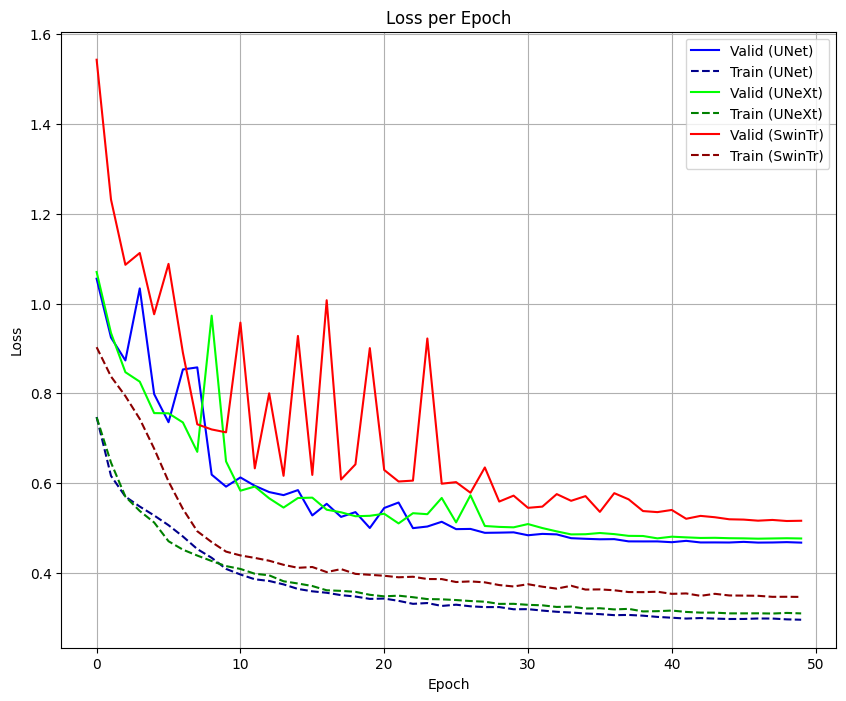

In [34]:
def plot_loss(history1, history2=None, history3=None):
    """ Visualize loss history for both models. """
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.plot(history1['valid_loss'], label='Valid (UNet)', color="blue")
    ax.plot(history1['train_loss'], label='Train (UNet)', color="darkblue", linestyle='--')
    if history2 is not None:
        ax.plot(history2['valid_loss'], label='Valid (UNeXt)', color="lime")
        ax.plot(history2['train_loss'], label='Train (UNeXt)', color="green", linestyle='--')
    if history3 is not None:
        ax.plot(history3['valid_loss'], label='Valid (SwinTr)', color="red")
        ax.plot(history3['train_loss'], label='Train (SwinTr)', color="darkred", linestyle='--')
    ax.set_title('Loss per Epoch')
    ax.set_ylabel('Loss')
    ax.set_xlabel('Epoch')
    ax.legend()
    ax.grid()
    plt.savefig('plot_loss.png')
    plt.show()
    plt.close(fig)

plot_loss(mhist_1, mhist_2, mhist_3)
# plot_loss(mhist_1)

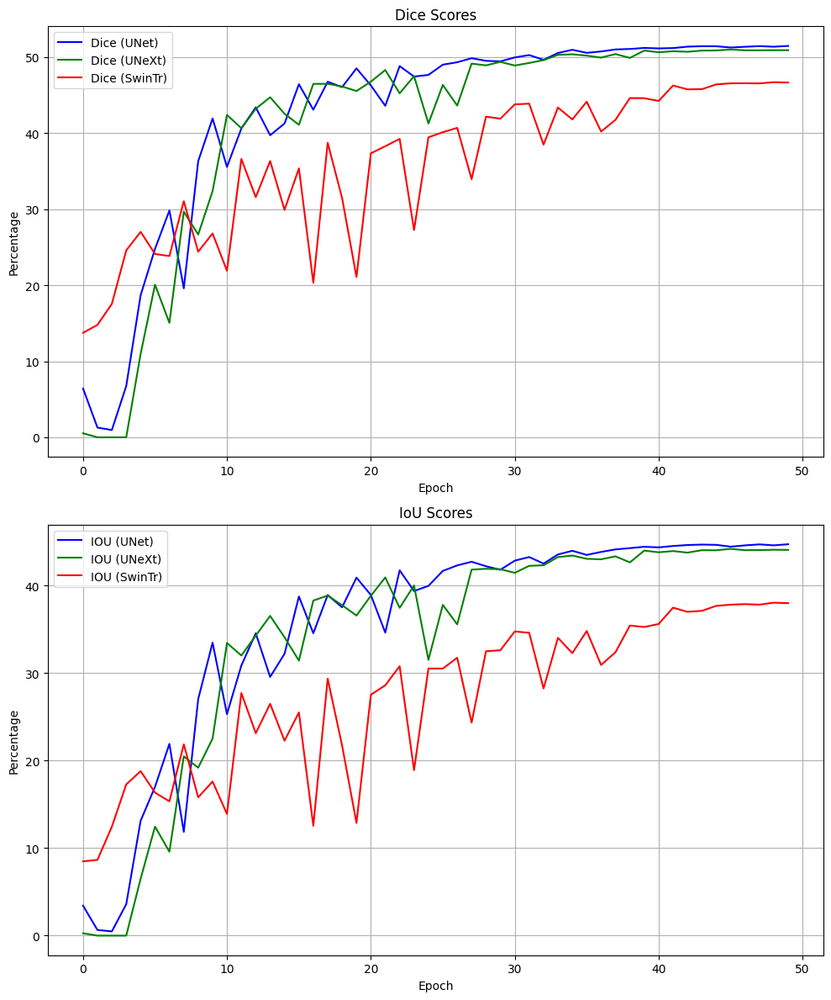

In [35]:
def plot_metrics(history1, history2=None, history3=None):
    """ Visualize metrics history for all models in a pair plot. """
    fig, axs = plt.subplots(2, 1, figsize=(10, 12))

    # Subplot for Dice scores
    axs[0].plot(history1['d_score'] * 100, label='Dice (UNet)', color="blue")
    if history2 is not None:
        axs[0].plot(history2['d_score'] * 100, label='Dice (UNeXt)', color="green")
    if history3 is not None:
        axs[0].plot(history3['d_score'] * 100, label='Dice (SwinTr)', color="red")
    axs[0].set_title('Dice Scores')
    axs[0].set_ylabel('Percentage')
    axs[0].set_xlabel('Epoch')
    axs[0].legend()
    axs[0].grid()

    # Subplot for Iou scores
    axs[1].plot(history1['iou'], label='IOU (UNet)', color="blue")
    if history2 is not None:
        axs[1].plot(history2['iou'], label='IOU (UNeXt)', color="green")
    if history3 is not None:
        axs[1].plot(history3['iou'], label='IOU (SwinTr)', color="red")
    axs[1].set_title('IoU Scores')
    axs[1].set_ylabel('Percentage')
    axs[1].set_xlabel('Epoch')
    axs[1].legend()
    axs[1].grid()

    plt.tight_layout()
    plt.savefig('plot_metrics.png')
    plt.show()
    plt.close(fig)

plot_metrics(mhist_1, mhist_2, mhist_3)
# plot_metrics(mhist_1)

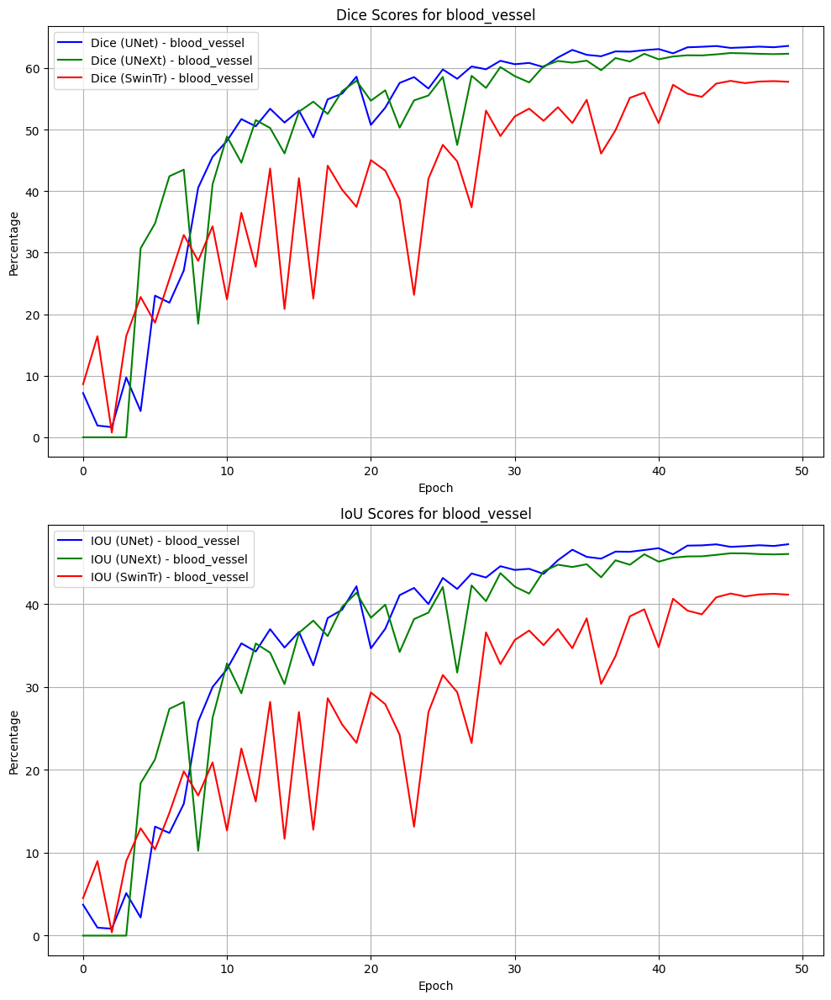

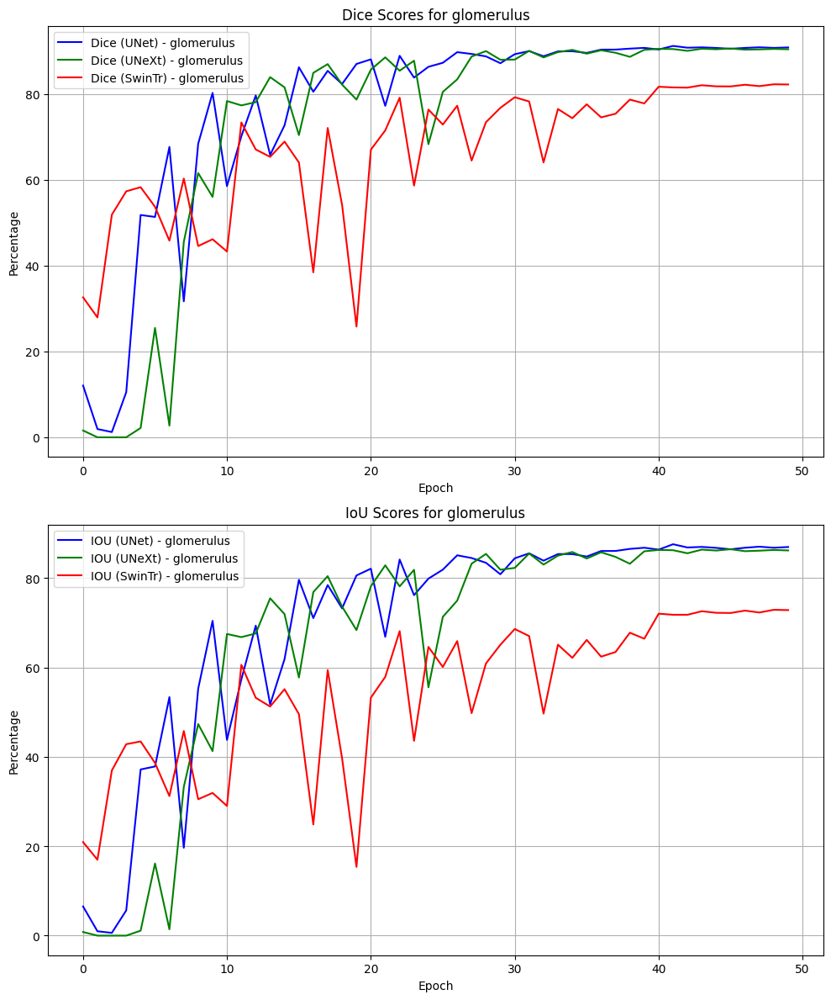

In [36]:
def plot_class_metrics(history1, history2=None, history3=None, class_name="blood_vessel"):
    """ Visualize class related metrics history for all models in a pair plot. """
    fig, axs = plt.subplots(2, 1, figsize=(10, 12))

    # Subplot for Dice scores
    axs[0].plot(history1['d_score'] * 100, label=f'Dice (UNet) - {class_name}', color="blue")
    if history2 is not None:
        axs[0].plot(history2['d_score'] * 100, label=f'Dice (UNeXt) - {class_name}', color="green")
    if history3 is not None:
        axs[0].plot(history3['d_score'] * 100, label=f'Dice (SwinTr) - {class_name}', color="red")
    axs[0].set_title(f'Dice Scores for {class_name}')
    axs[0].set_ylabel('Percentage')
    axs[0].set_xlabel('Epoch')
    axs[0].legend()
    axs[0].grid()

    # Subplot for Iou scores
    axs[1].plot(history1['iou'], label=f'IOU (UNet) - {class_name}', color="blue")
    if history2 is not None:
        axs[1].plot(history2['iou'], label=f'IOU (UNeXt) - {class_name}', color="green")
    if history3 is not None:
        axs[1].plot(history3['iou'], label=f'IOU (SwinTr) - {class_name}', color="red")
    axs[1].set_title(f'IoU Scores for {class_name}')
    axs[1].set_ylabel('Percentage')
    axs[1].set_xlabel('Epoch')
    axs[1].legend()
    axs[1].grid()

    plt.tight_layout()
    plt.savefig(f'plot_class_metrics_{class_name}.png')
    plt.show()
    plt.close(fig)

plot_class_metrics(mhist_1_bl, mhist_2_bl, mhist_3_bl, class_name="blood_vessel")
plot_class_metrics(mhist_1_gl, mhist_2_gl, mhist_3_gl, class_name="glomerulus")
# plot_class_metrics(mhist_1_bl, class_name="blood_vessel")
# plot_class_metrics(mhist_1_gl, class_name="glomerulus")

## Inference

Let's also calculate some evaluation metrics and compare the prediction results of the models with visualizations.

In [37]:
def calculate_per_class_stats(pred_class, lbl):
    """ Calculate pixel accuracy, iou, and dice score for each target class. """
    pixel_acc = {}
    dice = {}
    iou = {}
    for class_name, class_id in CFG.cls_dict.items():
        pred_mask = pred_class == class_id
        true_mask = lbl == class_id

        intersection = (pred_mask & true_mask).sum().item()
        union = (pred_mask | true_mask).sum().item()

        num_correct = (pred_mask == true_mask).sum().item()
        num_pixels = torch.numel(true_mask)

        if num_correct > 0:
            pixel_acc[class_name] = num_correct / num_pixels * 100
            iou[class_name] = intersection / union * 100 if union > 0 else 0
            dice[class_name] = dice_score(pred_mask, true_mask)
        else:
            pixel_acc[class_name] = 0
            iou[class_name] = 0
            dice[class_name] = 0
    return pixel_acc, dice, iou

def calculate_overall_stats(pred_class, lbl):
    """ Calculate overall statistics of pixel accuracy, iou, and dice score. """
    num_correct = (pred_class == lbl).sum().item()
    num_pixels = torch.numel(lbl)
    intersection = (pred_class & lbl).sum().item()
    union = (pred_class | lbl).sum().item()
    pixel_acc_overall = num_correct / num_pixels * 100
    iou_overall = intersection / union * 100 if union > 0 else 0
    dice_score_overall = dice_score(pred_class, lbl)
    return pixel_acc_overall, iou_overall, dice_score_overall

def calculate_precision_recall_f1(pred_class, lbl):
    """ Calculate precision, recall and f1 score for each class. """
    labels = list(CFG.cls_dict.values())
    class_names = list(CFG.cls_dict.keys())
    precision, recall, f1_score, _ = precision_recall_fscore_support(lbl, pred_class, average=None, zero_division=0.0, labels=labels)
    metrics = {
        class_name: {
            'precision': p * 100,
            'recall': r * 100,
            'f1': f * 100
        }
        for class_name, p, r, f in zip(class_names, precision, recall, f1_score)
    }
    return metrics

def visualize_predictions(image, label, img_id, 
                          pred_class_1, pred_class_2, pred_class_3, 
                          model_name_1, model_name_2, model_name_3, 
                          cls_text, ovr_text, metrics_text):
    """ Create a visualization plot from the predictions. """
    pred_class_1 = pred_class_1.cpu().numpy().swapaxes(0, -1)
    pred_class_2 = pred_class_2.cpu().numpy().swapaxes(0, -1)
    pred_class_3 = pred_class_3.cpu().numpy().swapaxes(0, -1)
    label = label.cpu().numpy().swapaxes(0, -1)
    image = image.cpu().numpy().swapaxes(0, -1)
    image = reverse_norm(image, CFG.mean, CFG.std)

    fig, axs = plt.subplots(1, 5, figsize=(16, 6))
    plt.subplots_adjust(bottom=0.01)
    fig.text(0.15, 0.15, metrics_text, va='top', ha='left', fontsize=10)
    fig.text(0.40, 0.15, cls_text, va='top', ha='left', fontsize=10)
    fig.text(0.65, 0.15, ovr_text, va='top', ha='left', fontsize=10)
    axs[0].imshow(image)
    axs[0].set_title("Image")
    axs[1].imshow(image)
    axs[1].imshow(label, alpha=0.6)
    axs[1].set_title("Ground Truth")    
    axs[2].imshow(image)
    axs[2].imshow(pred_class_1, alpha=0.6)
    axs[2].set_title(f"{model_name_1} predictions")
    axs[3].imshow(image)
    axs[3].imshow(pred_class_2, alpha=0.6)
    axs[3].set_title(f"{model_name_2} predictions")
    axs[4].imshow(image)
    axs[4].imshow(pred_class_3, alpha=0.6)
    axs[4].set_title(f"{model_name_3} predictions")
    for ax in axs:
        ax.axis('off')
    plt.show()
    plt.savefig(f'visualize_predictions_{img_id}.png')

def visualize_cm(labels, preds_1, preds_2, preds_3, model_name_1, model_name_2, model_name_3):
    """ Computes and visualize confusion matrix. """
    conf_matrix_1 = confusion_matrix(labels, preds_1)
    conf_matrix_2 = confusion_matrix(labels, preds_2)
    conf_matrix_3 = confusion_matrix(labels, preds_3)
    fig, axes = plt.subplots(1, 3, figsize=(10, 3))
    sns.heatmap(conf_matrix_1, annot=True, fmt="d", ax=axes[0], cmap="Blues")
    axes[0].set_title(f"Confusion Matrix - {model_name_1}")
    axes[0].set_xlabel("Predicted")
    axes[0].set_ylabel("Ground Truth")
    sns.heatmap(conf_matrix_2, annot=True, fmt="d", ax=axes[1], cmap="Greens")
    axes[1].set_title(f"Confusion Matrix - {model_name_2}")
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("Ground Truth")
    sns.heatmap(conf_matrix_3, annot=True, fmt="d", ax=axes[2], cmap="Reds")
    axes[2].set_title(f"Confusion Matrix - {model_name_3}")
    axes[2].set_xlabel("Predicted")
    axes[2].set_ylabel("Ground Truth")
    plt.tight_layout()
    plt.show()

def predict_on_batch(batch_of_data, eval_model_1, eval_model_2, eval_model_3,
                     model_name_1="UNet", model_name_2="UNeXt",model_name_3="SwinTr"):
    m1_avg_iou, m1_avg_dice = [], []
    m2_avg_iou, m2_avg_dice = [], []
    m3_avg_iou, m3_avg_dice = [], []
    
    for img, lbl, img_id, _ in zip(batch_of_data[0], batch_of_data[1], batch_of_data[2], batch_of_data[3]):
        img = img.to(device)
        lbl = lbl.to(device)
        img_to_pred = torch.unsqueeze(img, 0).to(torch.float32)

        # Model 1-2-3 predictions
        pred_logits_1 = eval_model_1(img_to_pred)
        pred_class_1 = torch.argmax(pred_logits_1, axis=1).squeeze(0)
        pred_logits_2 = eval_model_2(img_to_pred)
        pred_class_2 = torch.argmax(pred_logits_2, axis=1).squeeze(0)
        pred_logits_3 = eval_model_3(img_to_pred)
        pred_class_3 = torch.argmax(pred_logits_3, axis=1).squeeze(0)

        # Flatten predictions and labels
        flat_pred_class_1 = pred_class_1.cpu().numpy().flatten()
        flat_pred_class_2 = pred_class_2.cpu().numpy().flatten()
        flat_pred_class_3 = pred_class_3.cpu().numpy().flatten()
        flat_lbl = lbl.cpu().numpy().flatten()
        
        # Calculate class related stats
        pixel_acc_1, dice_1, iou_1 = calculate_per_class_stats(pred_class_1, lbl)
        pixel_acc_2, dice_2, iou_2 = calculate_per_class_stats(pred_class_2, lbl)
        pixel_acc_3, dice_3, iou_3 = calculate_per_class_stats(pred_class_3, lbl)

        # Calculate overall statistics
        pixel_acc_overall_1, iou_overall_1, dice_score_overall_1 = calculate_overall_stats(pred_class_1, lbl)
        pixel_acc_overall_2, iou_overall_2, dice_score_overall_2 = calculate_overall_stats(pred_class_2, lbl)
        pixel_acc_overall_3, iou_overall_3, dice_score_overall_3 = calculate_overall_stats(pred_class_3, lbl)
        m1_avg_iou.append(iou_overall_1)
        m1_avg_dice.append(dice_score_overall_1)
        m2_avg_iou.append(iou_overall_2)
        m2_avg_dice.append(dice_score_overall_2)
        m3_avg_iou.append(iou_overall_3)
        m3_avg_dice.append(dice_score_overall_3)
        
        # Calculate precision, recall, f1 statistics
        p_r_f1_1 = calculate_precision_recall_f1(flat_pred_class_1, flat_lbl)
        p_r_f1_2 = calculate_precision_recall_f1(flat_pred_class_2, flat_lbl)
        p_r_f1_3 = calculate_precision_recall_f1(flat_pred_class_3, flat_lbl)

        # Figure metrics info
        class_info_1, class_info_2, class_info_3 = "","",""
        for class_name, _ in dice_1.items():
            class_info_1 += f"- {class_name}: IoU: {iou_1[class_name]:.2f}% -- Dice score: {dice_1[class_name]:.2f}\n"
        for class_name, _ in dice_2.items():
            class_info_2 += f"- {class_name}: IoU: {iou_2[class_name]:.2f}% -- Dice score: {dice_2[class_name]:.2f}\n"
        for class_name, _ in dice_3.items():
            class_info_3 += f"- {class_name}: IoU: {iou_3[class_name]:.2f}% -- Dice score: {dice_3[class_name]:.2f}\n"
        cls_text = f"IoU/Dice per class:\n{model_name_1}:\n{class_info_1}\n{model_name_2}:\n{class_info_2}\n{model_name_3}:\n{class_info_3}"

        ovr_info_1 = f"- IoU: {iou_overall_1:.2f}%\n- Dice score: {dice_score_overall_1:.2f}"
        ovr_info_2 = f"- IoU: {iou_overall_2:.2f}%\n- Dice score: {dice_score_overall_2:.2f}"
        ovr_info_3 = f"- IoU: {iou_overall_3:.2f}%\n- Dice score: {dice_score_overall_3:.2f}"
        ovr_text = f"Overall metrics:\n{model_name_1}:\n{ovr_info_1}\n\n{model_name_2}:\n{ovr_info_2}\n\n{model_name_3}:\n{ovr_info_3}"

        metrics_info_1, metrics_info_2, metrics_info_3 = "","",""
        for class_name, _ in CFG.cls_dict.items():
            metrics_info_1 += f"- {class_name}: P: {p_r_f1_1[class_name]['precision']:.2f}% -- R: {p_r_f1_1[class_name]['recall']:.2f}% -- F1: {p_r_f1_1[class_name]['f1']:.2f}\n"
            metrics_info_2 += f"- {class_name}: P: {p_r_f1_2[class_name]['precision']:.2f}% -- R: {p_r_f1_2[class_name]['recall']:.2f}% -- F1: {p_r_f1_2[class_name]['f1']:.2f}\n"
            metrics_info_3 += f"- {class_name}: P: {p_r_f1_3[class_name]['precision']:.2f}% -- R: {p_r_f1_3[class_name]['recall']:.2f}% -- F1: {p_r_f1_3[class_name]['f1']:.2f}\n"
        metrics_text = f"Precision/Recall/F1 per class:\n{model_name_1}:\n{metrics_info_1}\n{model_name_2}:\n{metrics_info_2}\n{model_name_3}:\n{metrics_info_3}"

        # Visualize results on both models
        visualize_predictions(img, lbl, img_id, pred_class_1, pred_class_2, pred_class_3, 
                              model_name_1, model_name_2, model_name_3, cls_text, ovr_text, metrics_text)
        visualize_cm(flat_lbl, flat_pred_class_1, flat_pred_class_2, flat_pred_class_3, model_name_1, model_name_2, model_name_3)

    avg_iou = [np.mean(m1_avg_iou), np.mean(m2_avg_iou), np.mean(m3_avg_iou)]
    avg_dice = [np.mean(m1_avg_dice), np.mean(m2_avg_dice), np.mean(m3_avg_dice)]
    return avg_iou, avg_dice


Batch 1:


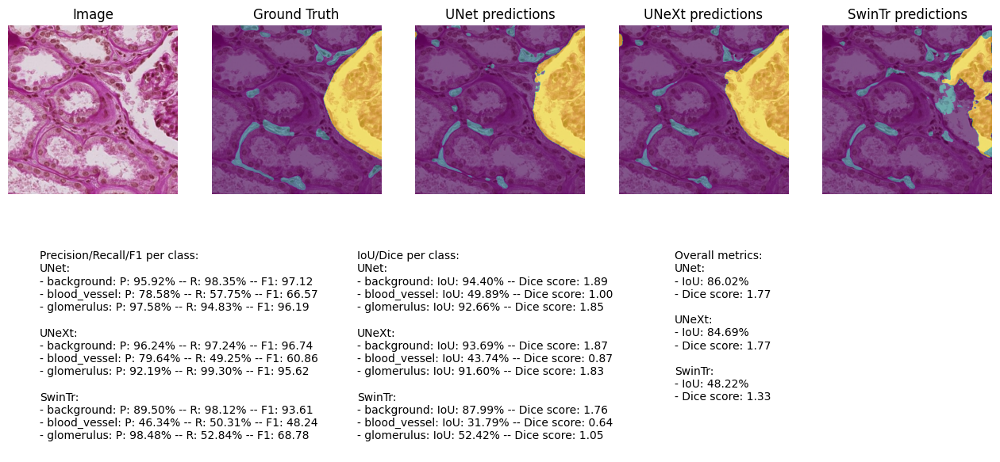

<Figure size 640x480 with 0 Axes>

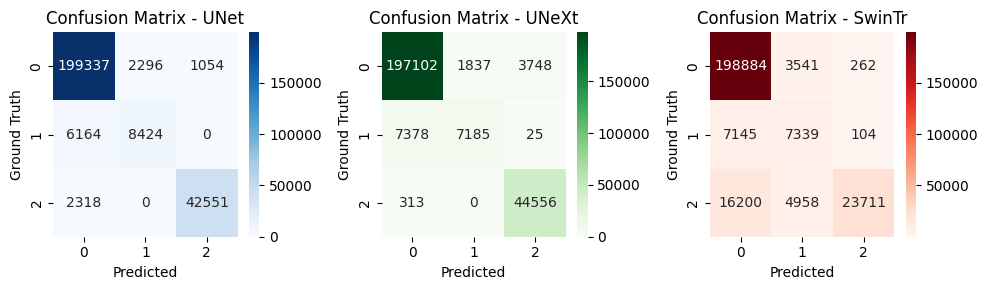

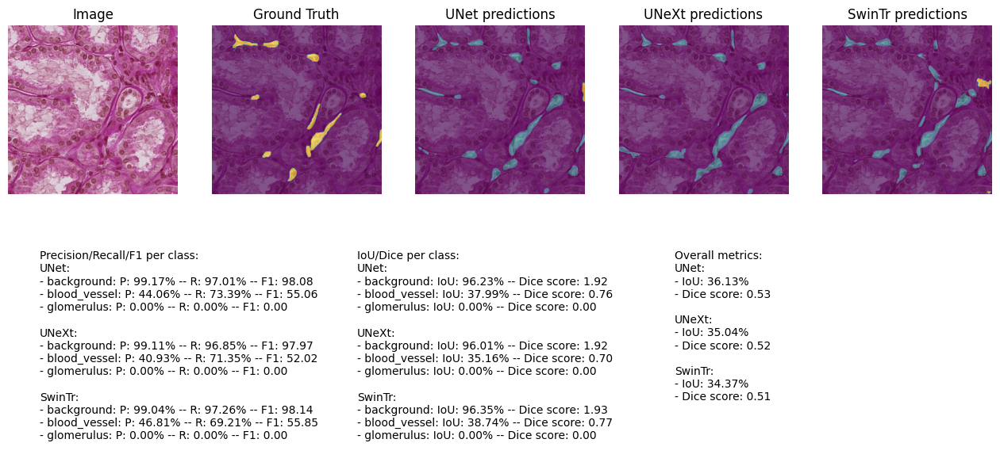

<Figure size 640x480 with 0 Axes>

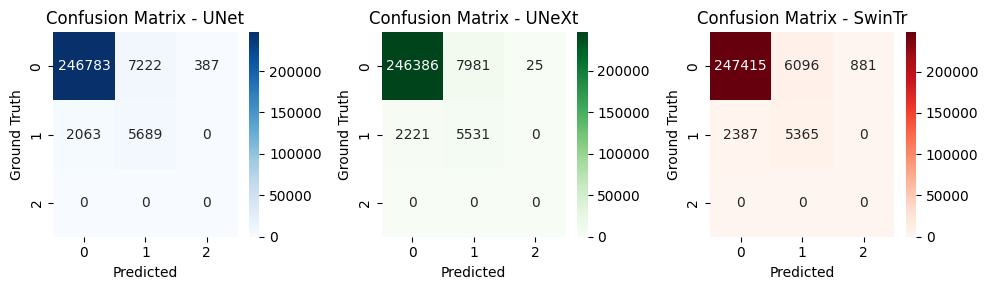

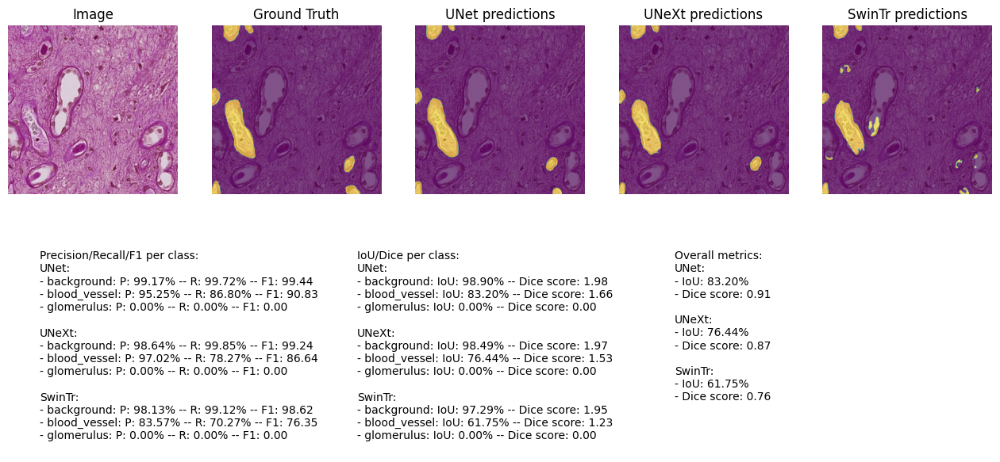

<Figure size 640x480 with 0 Axes>

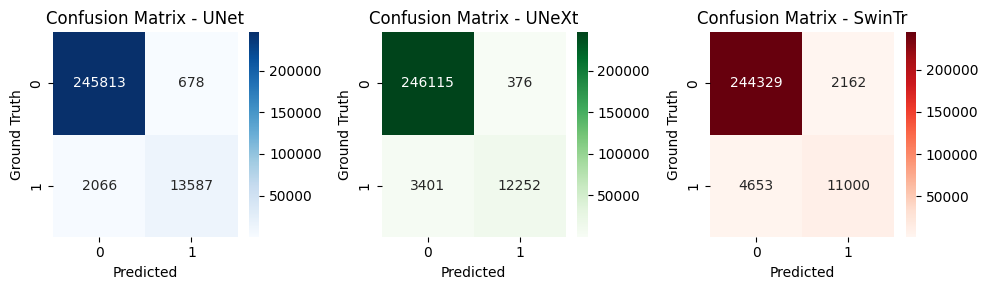

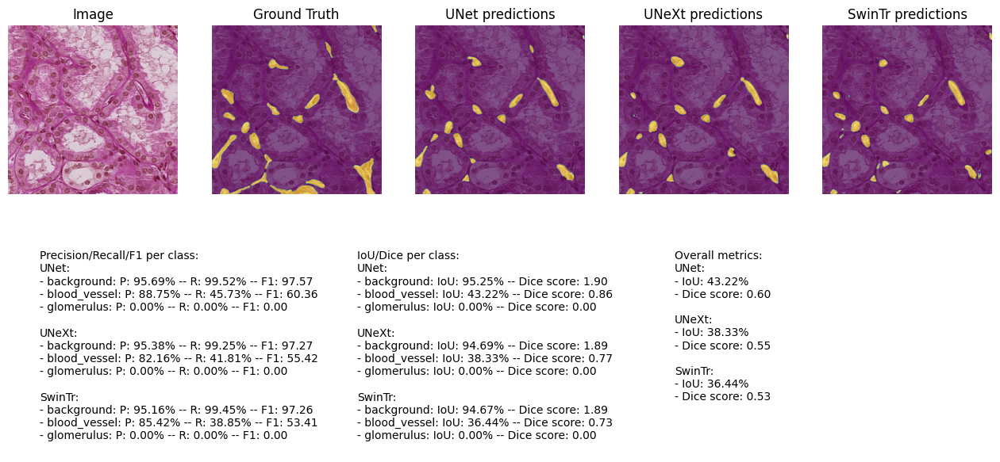

<Figure size 640x480 with 0 Axes>

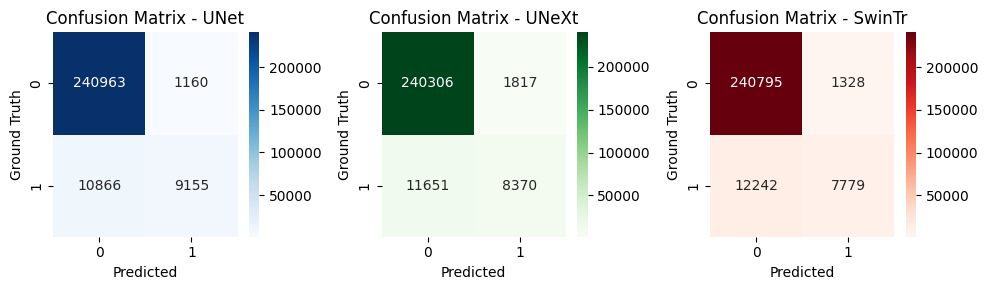

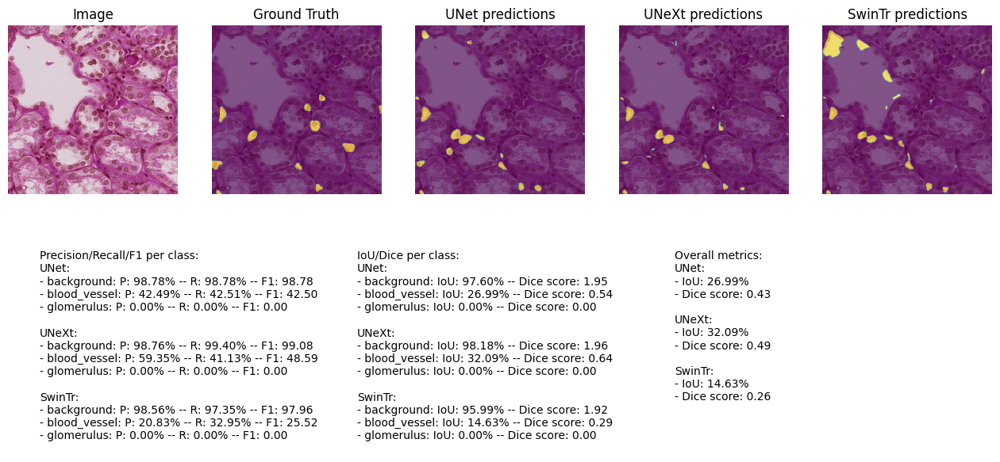

<Figure size 640x480 with 0 Axes>

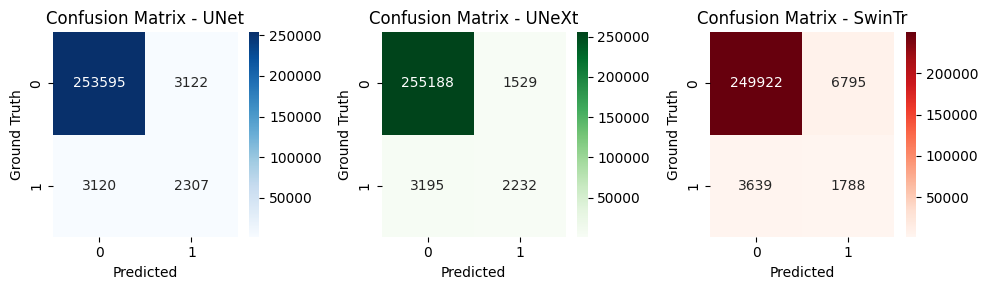

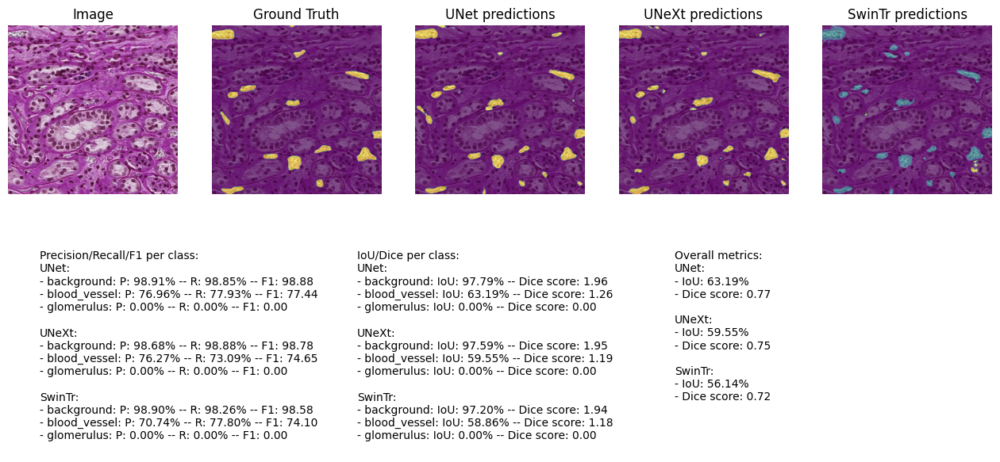

<Figure size 640x480 with 0 Axes>

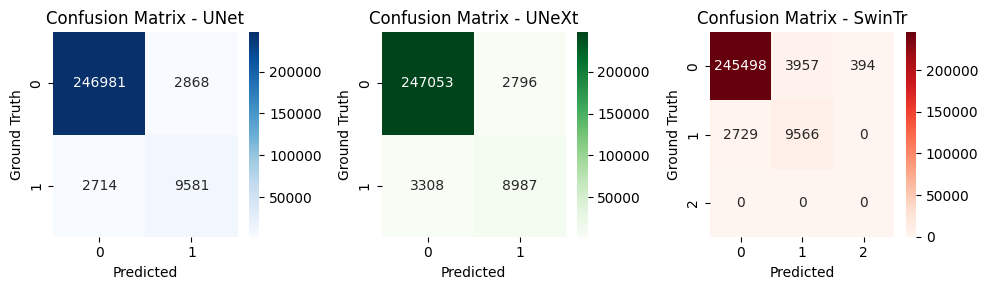

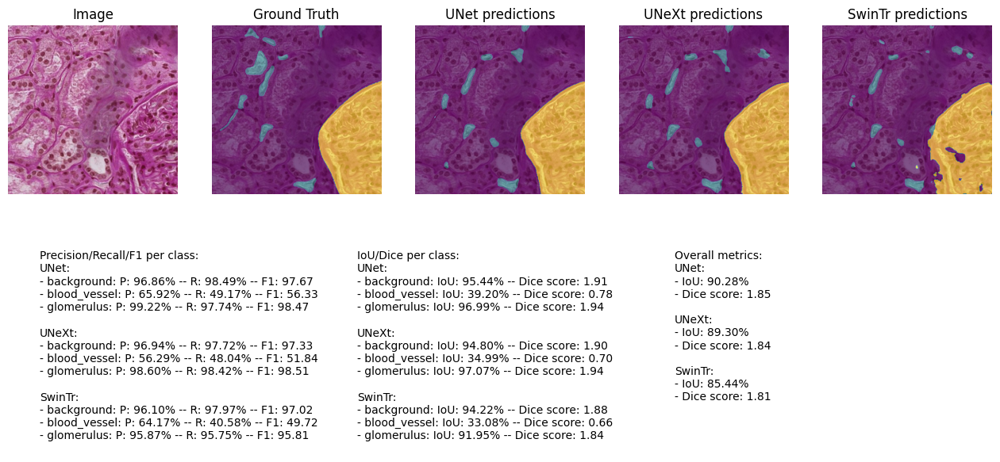

<Figure size 640x480 with 0 Axes>

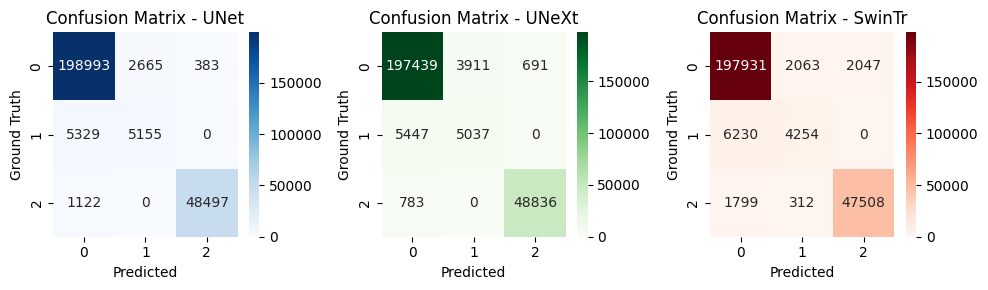

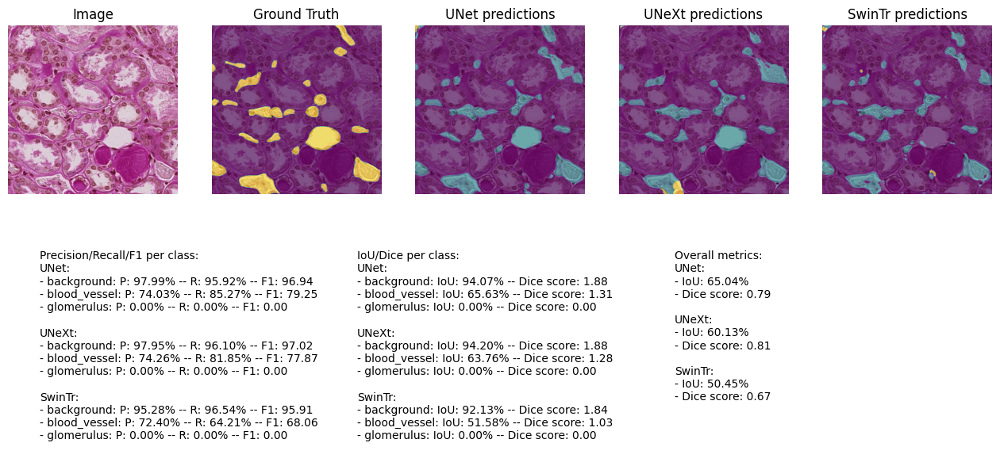

<Figure size 640x480 with 0 Axes>

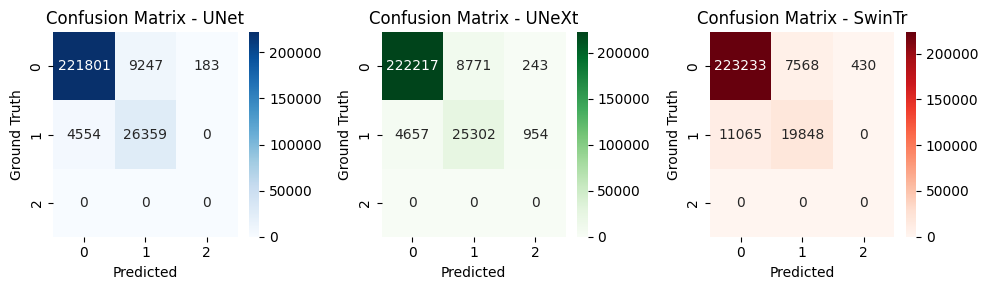

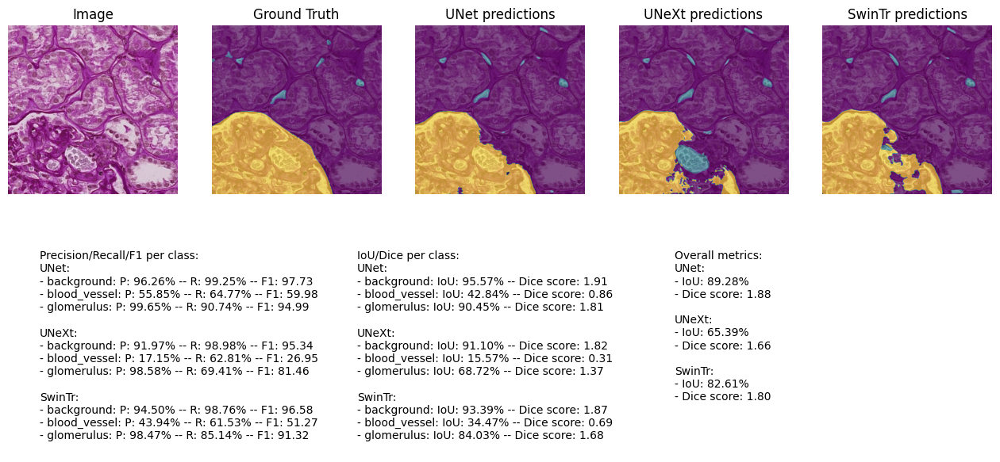

<Figure size 640x480 with 0 Axes>

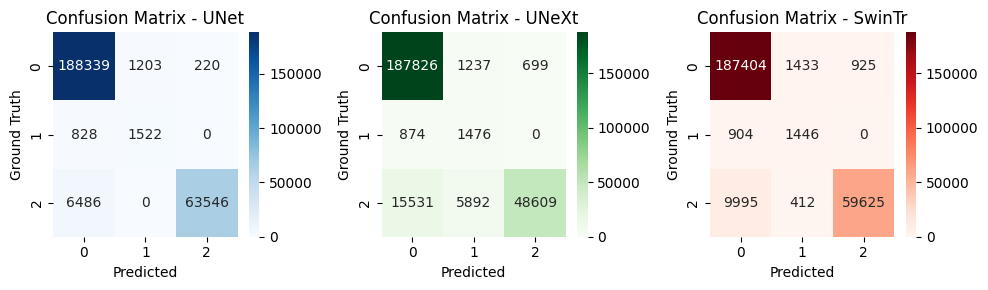

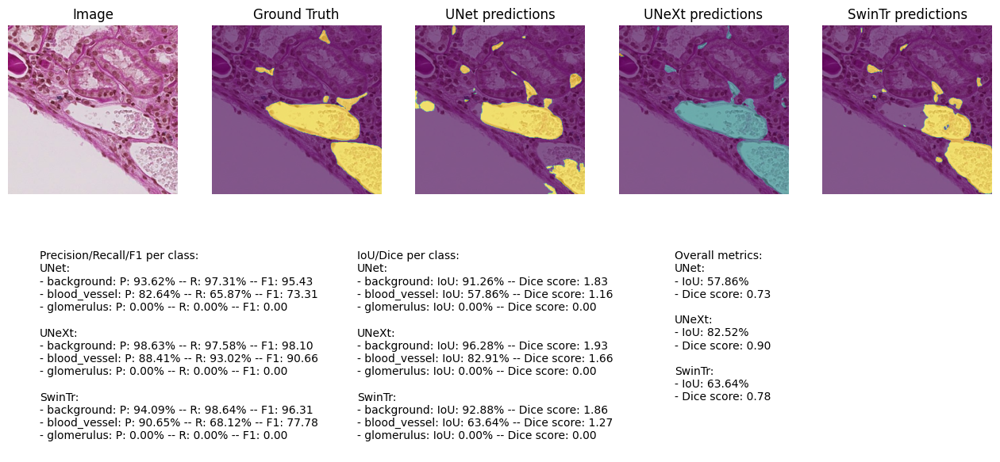

<Figure size 640x480 with 0 Axes>

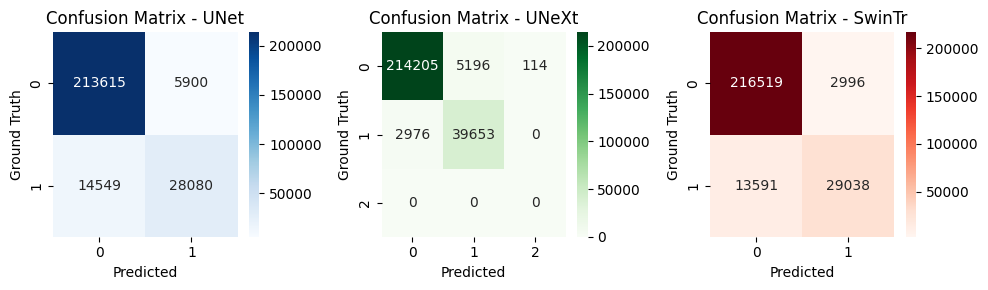

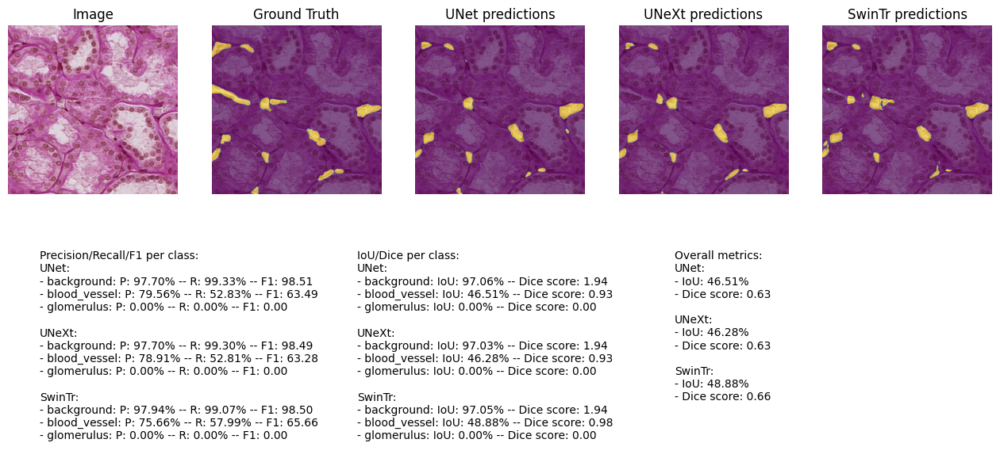

<Figure size 640x480 with 0 Axes>

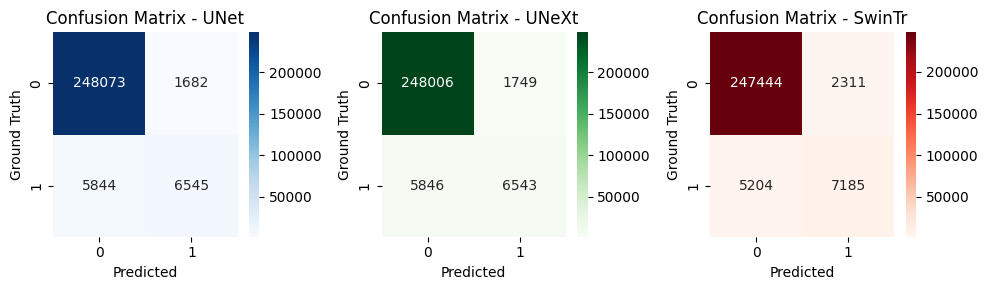

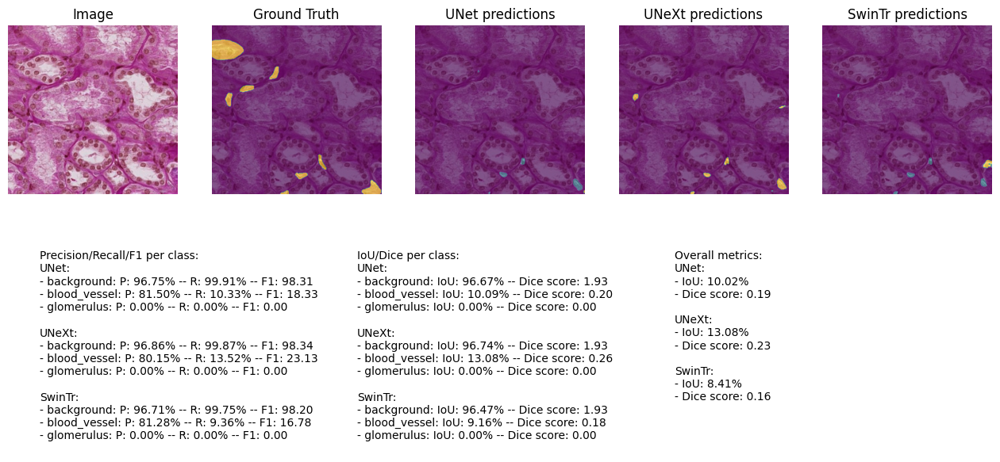

<Figure size 640x480 with 0 Axes>

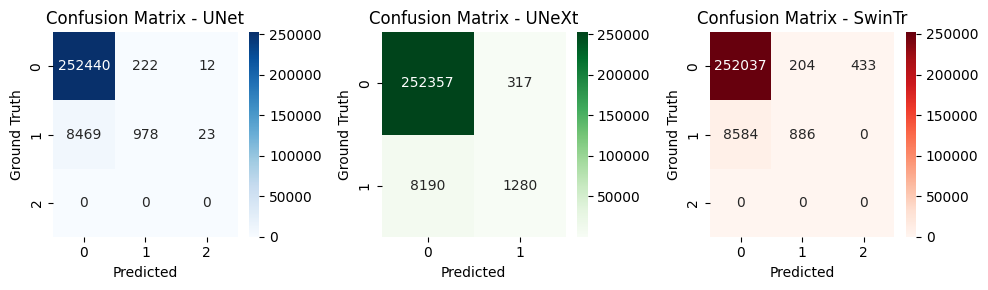

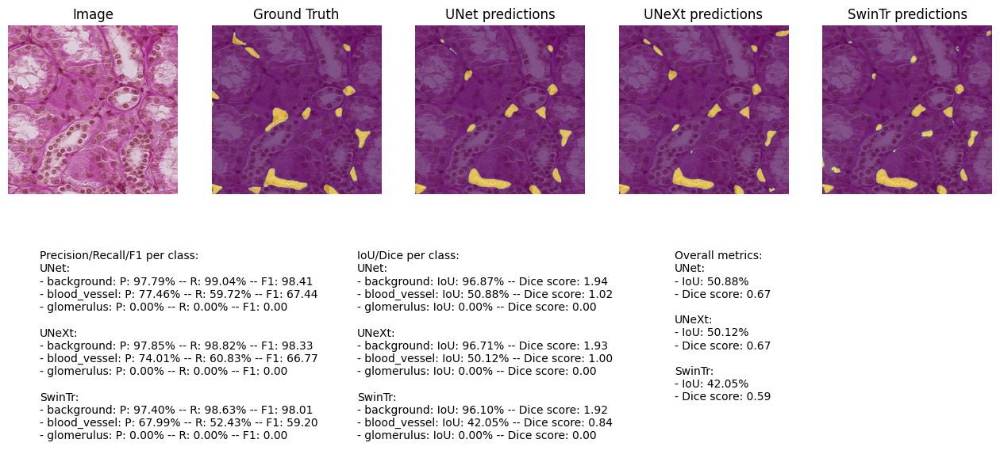

<Figure size 640x480 with 0 Axes>

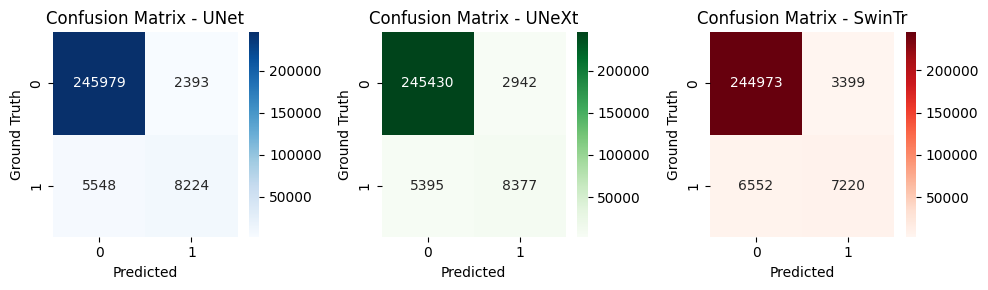

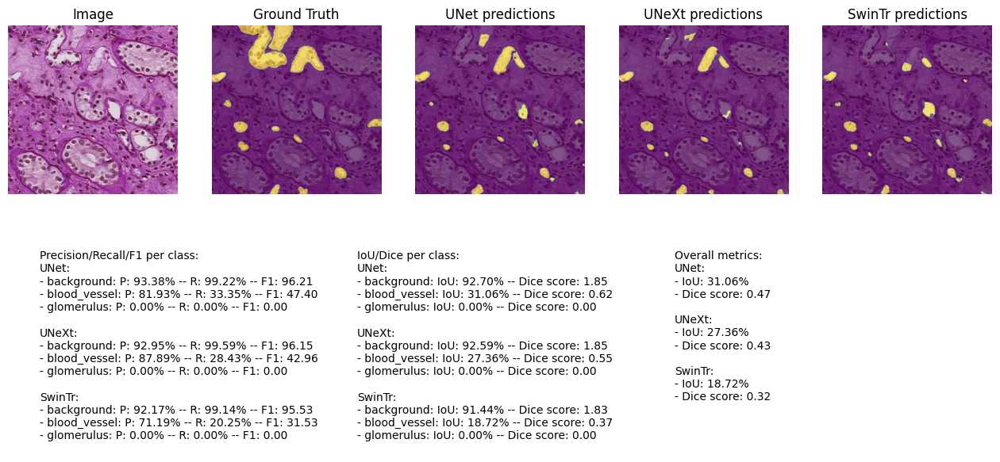

<Figure size 640x480 with 0 Axes>

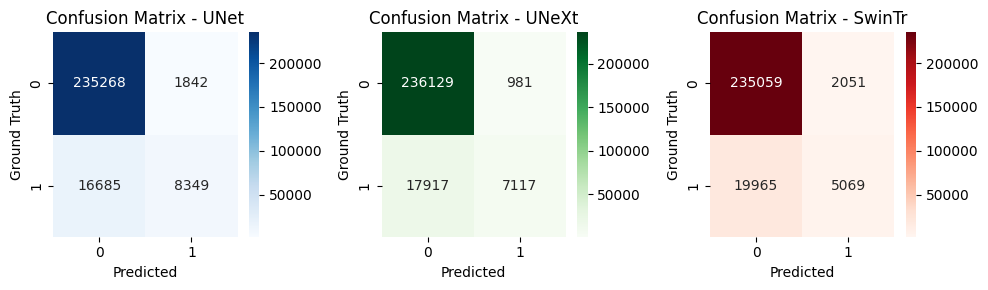

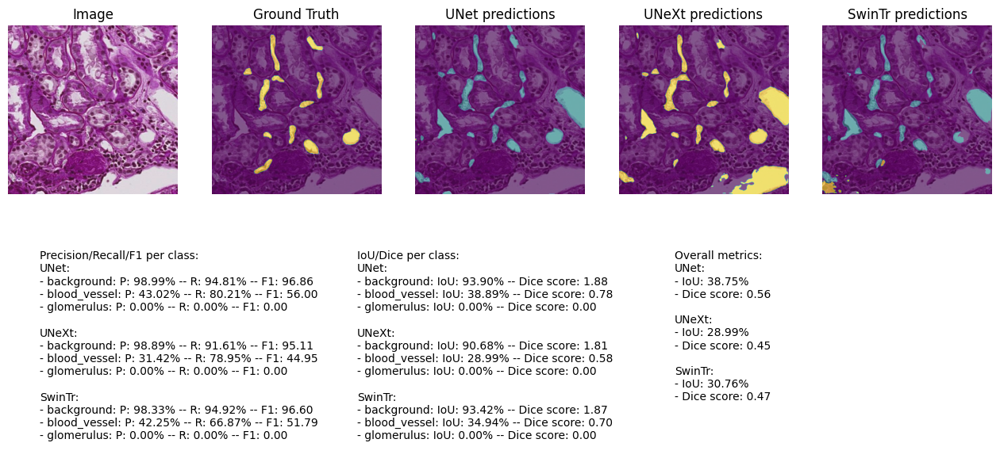

<Figure size 640x480 with 0 Axes>

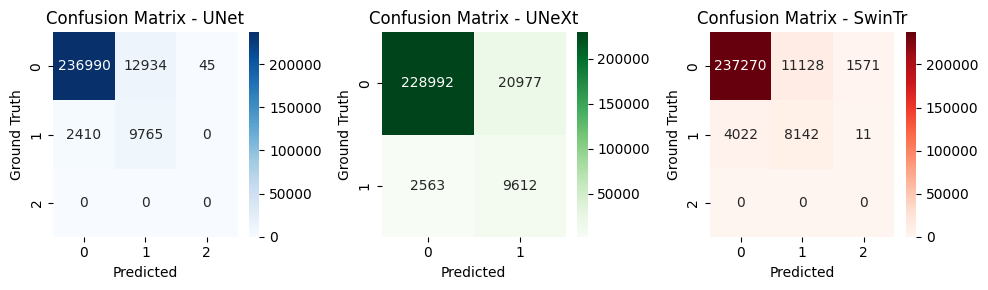

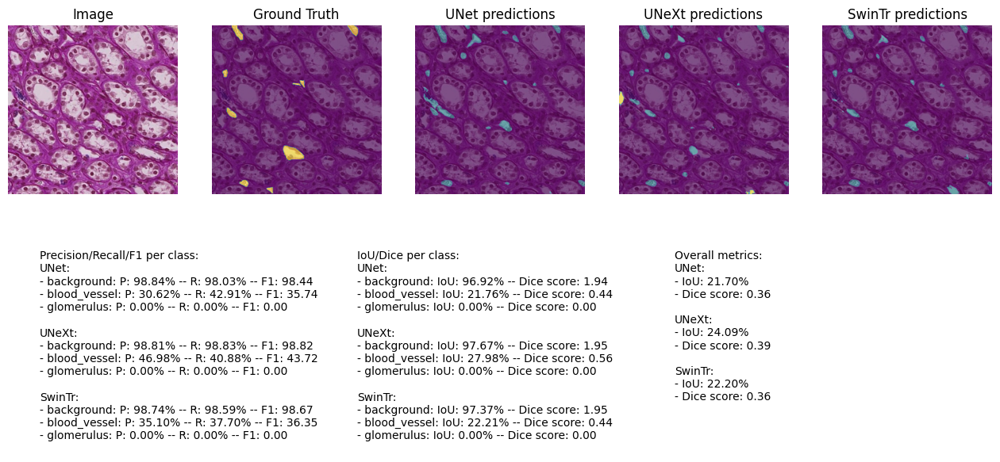

<Figure size 640x480 with 0 Axes>

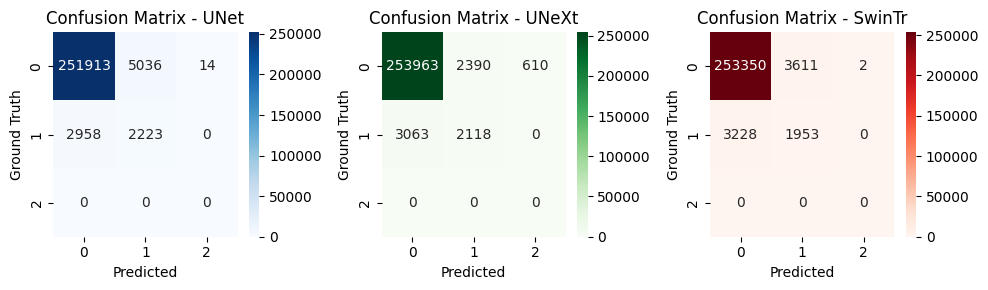

Average metrics on all test samples:
    Model        IoU      Dice
0  SwinTr  44.043475  0.733421
1   UNeXt  50.837081  0.809625
2    UNet  52.507303  0.821523


/tmp/ipykernel_19/2479987984.py:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_batch_info = pd.concat([all_batch_info, pd.DataFrame({"Model": ["UNet", "UNeXt", "SwinTr"], "IoU": avg_iou, "Dice": avg_dice})], ignore_index=True)


In [38]:
## Load in trained models
best_model_1 = "/kaggle/working/best_unet_state.h5"
inf_model_1 = UNet(in_filters=CFG.filters, num_classes=CFG.num_classes, conv_block_type=CFG.conv_block_type, tta_transforms=CFG.tta_tfms)
inf_model_1.load_state_dict(torch.load(best_model_1))
inf_model_1.eval().to(device)

best_model_2 = "/kaggle/working/best_unext_state.h5"
inf_model_2 = UNext(num_classes=CFG.num_classes)
inf_model_2.load_state_dict(torch.load(best_model_2))
inf_model_2.eval().to(device)

best_model_3 = "/kaggle/working/best_swintr_state.h5"
inf_model_3 = SwinSegmentationModel(num_classes=CFG.num_classes)
inf_model_3.load_state_dict(torch.load(best_model_3))
inf_model_3.eval().to(device)

# Predict on test set
all_batch_info = pd.DataFrame(columns=["Model", "IoU", "Dice"])
for i, batch_data in enumerate(test_loader):
    print(f"Batch {i+1}:")
    avg_iou, avg_dice = predict_on_batch(batch_data, inf_model_1, inf_model_2, inf_model_3, model_name_1="UNet", model_name_2="UNeXt", model_name_3="SwinTr")
    all_batch_info = pd.concat([all_batch_info, pd.DataFrame({"Model": ["UNet", "UNeXt", "SwinTr"], "IoU": avg_iou, "Dice": avg_dice})], ignore_index=True)
    gc.collect()

# Print the average metrics on all test samples
overall_avg = all_batch_info.groupby("Model").mean().reset_index()
print("Average metrics on all test samples:")
print(overall_avg)